# Time-Series Reconstruction, Modeling, and Analysis
### ------------------------------------------------------------------------------------------------------

### Problem Statement
The original goal of this project was to apply Statistical and Machine Learning modeling approaches for 'kW' power-production values at a 468-kW-capacity solar farm. Various solar and atmospheric data were provided alongside this target and would serve as model inputs.
### ------------------------------------------------------------------------------------------------------
### EDA and Challenges
Throughout EDA, I encountered various unique qualities of the data, including but not limited to:
* Inconsistent data frequency
    * Validation data was randomly sampled as opposed to Time-Series split. Additionally, the full, **contiguous** dataset was still not **continuous** and contained significant gaps.
* Highly-variable, NaN-inclusive atmospheric features and their influence on 'kw' behavior
    * Features such as 'cloud_total_mean' and 'temp_total_mean' required investigation
* Daytime vs. Nighttime data and their effects on data reconstruction
* Usage of "Solar Position" and "Solar Quality" features

In addition, it's worth mentioning that the nature of our data meant it would be difficult to attempt Forecasting, with not much clarity or value easily in sight from this. Split and inconsistent as the data was, reconstruction would introduce sources of error that could compound into new models, while weather data as a Feature in our process contributed its own challenges. Even if we could construct a continuous set of data for the whole year, since weather modeling is itself so difficult, could we build a 'kW' horizon any further than we could for weather?

### ------------------------------------------------------------------------------------------------------
### Process and Solutions
Exploration of our challenges led us through a two-stage process outlined here:
1) Data Reconstruction
    * Motivation :
        * In order to properly apply Statistical Analysis, we need a "complete" span of data across our given time-period at a constant frequency. This includes both our Target and relevant Features.
    * Solution :
        * Optimize an ML Model of the data that we **do** have, allowing us to fill any data points for which we are **only** missing the Target.
        * Identify the gaps in our data, where we are missing entire sets of **both** Features and Target across a given time-period.
        * Apply various interpolation, filling, smoothing techniques to create data points throughout all gaps in our original set
        * Apply our optimized ML Model to the interpolated Feature data to predict Target values at these points, "completing" our dataset across the entire span
2) Time-Series Analysis
    * Motivation :
        * Understand if and how Time truly influences our data ('kW' production) beyond and including obvious factors like Daytime/Nighttime or Season.
            * Reconsider the data in various ways when analyzing, such as "Daily Total Production"
    * Solution :
        * Time-Series Decomposition
            * Additive, Multiplicative : Allows us to separate and identify Seasonal, Trend, Residual components of our data
            * Testing for and Transforming to Stationarity : Differencing, De-Trending, De-Seasoning 
            * Autocorrelation (ACF) and Partial Autocorrelation (PACF) : Identify correlation between points in time 't' and time 't-k', as well as "successive" correlations amongst 't' <- 't-1' <- 't-2' for example.


### ------------------------------------------------------------------------------------------------------
# Data Dictionary
### ------------------------------------------------------------------------------------------------------

- 'start'               – start of 15-minute interval time of measurement (i.e. 12:15:00 to 12:29:59)
- 'kw'                  – power production (in 15-min interval)
- 'capacity_clipped'    – maximum solar farm power capacity
- 'time_hourly'         – hourly timestamp
- 'S_d'                 – direct beam solar radiation intensity. Typically measured in Watt/Steradian. NOTE: "Direct solar radiation" is shortwave radiation able to penetrate through the atmosphere without having been affected by constituents of the atmosphere in any way.
- 'airmass'             - quantifies the reduction in the power of light as it passes through the atmosphere and is absorbed by air and dust
- 'altitude'            – position of sun relative to the horizon (+65 is high noon Northern hemisphere, 0 is exactly at the horizon, -65 is high noon Southern hemisphere)
- 'azimuth'             – azimuthal angle (how far off of North the sun is in the sky throughout a full earth-rotation)[somewhere between 0-360 degrees over the course of a full day, squeezing/stretching over the year]

- 'irradiation'         – power-per-unit-area (surface power density) received from the Sun in the form of electromagnetic radiation in the wavelength range of the measuring instrument. Typically measured in [1] x100MJ/hr/m^2^ or [2] kW/m^2^. Convert [1]->[2] by dividing by 360).
- 'fold_cos'            – cosine of the sunlight’s incident angle on the ground
- 'panel_cos'           - cosine of the sunlight’s incident angle on the panel
    ^In other words, cosine of the angle between source-normal sunlight and normal of the ground or panel.
- 'day'                 – date
- 'sunrise'             – time of sunrise to the microsecond
- 'sunset'              – time of sunset to the microsecond
- 'rad_lw_mean'         – Long wave radiation
- 'precip_total_mean'   - average of total precipitation for a given time period. Typically measured in mm or in.
- 'cloud_total_mean'    - Percentage of the sky hidden by all visible clouds
- 'temp_total_mean'     - mean Temperature across 15-minute interval
- 'cloud_high_mean'     - Percentage of the sky hidden by high-altitude clouds
- 'rad_global_mean'     - "global" radiation refers to the capturing of radiation amounts by a "global" sensor, which is one that receives from 180-degrees of input as opposed to a smaller angle.
- 'cloud_low_mean'      - Percentage of the sky hidden by low-altitude clouds
- 'radNetS_lw_mean'     - Surface net long-wave (Earthly) radiation. NOTE: Heat energy absorbed by the Earth's surface, re-emitted toward the atmosphere as radiation, and reflected back down to the surface.
- 'cloud_mid_mean'      - Percentage of the sky hidden by medium-altitude clouds
- 'radNetS_sw_mean'     - Surface net short-wave (solar) radiation. NOTE: Solar radiation (direct or diffuse) that reaches the Earth's surface.

![Diagram](Azimuth-Altitude_schematic.svg.png)


## Tools Import and Dataframe

In [4]:
# data-wrangling
import pandas as pd
import numpy as np
import datetime as dt

# Plotting tools and presets
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use(['ggplot', 'tableau-colorblind10'])

# pv-specific libraries
import pvlib
import pvanalytics as pva

# time-series libraries
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from darts import TimeSeries    # analysis/modeling/prediction

# consider adtk library for Anomaly Detection if necessary

In [5]:
df_train = pd.read_csv('./renewable-energy-production-forecaster/train.csv')
df_test = pd.read_csv('./renewable-energy-production-forecaster/test.csv')

time_cols = ['start', 'time_hourly', 'day', 'sunrise', 'sunset']

df_train[time_cols] = df_train[time_cols].apply(pd.to_datetime, format='ISO8601')
df_test[time_cols] = df_test[time_cols].apply(pd.to_datetime, format='ISO8601')

In [6]:
print(len(df_train), len(df_test))

23465 10057


In [7]:
df_train

,ID,start,kw,capacity_clipped,time_hourly,S_d,airmass,altitude,azimuth,irradiation,...,rad_lw_mean,precip_total_mean,cloud_total_mean,temp_total_mean,cloud_high_mean,rad_global_mean,cloud_low_mean,radNetS_lw_mean,cloud_mid_mean,radNetS_sw_mean
0,0,2019-01-02 01:00:00,0.0,468.0,2019-01-02 01:00:00,0.0,-1.153310,-60.119844,39.300368,0.0,...,28559320.0,NaN,87.436623,2.016479,0.735016,3692351.75,0.517294,-4335172.0,0.510855,2910957.0
1,1,2019-01-02 01:15:00,0.0,468.0,2019-01-02 01:00:00,0.0,-1.173570,-58.440884,45.209051,0.0,...,28559320.0,NaN,87.436623,2.016479,0.735016,3692351.75,0.517294,-4335172.0,0.510855,2910957.0
2,2,2019-01-02 01:45:00,0.0,468.0,2019-01-02 01:00:00,0.0,-1.226941,-54.590829,55.621305,0.0,...,28559320.0,NaN,87.436623,2.016479,0.735016,3692351.75,0.517294,-4335172.0,0.510855,2910957.0
3,3,2019-01-02 02:45:00,0.0,468.0,2019-01-02 02:00:00,0.0,-1.398963,-45.628041,72.112254,0.0,...,29545328.0,NaN,59.624264,2.035498,0.012997,3692351.75,0.329642,-4500247.5,0.370873,2910957.0
4,4,2019-01-02 03:00:00,0.0,468.0,2019-01-02 03:00:00,0.0,-1.459987,-43.230706,75.591904,0.0,...,30531976.0,NaN,63.706104,2.246095,0.000000,3692351.75,0.238952,-4664002.0,0.493319,2910957.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23460,23460,2019-12-31 22:15:00,0.0,468.0,2019-12-31 22:00:00,0.0,-1.156434,-59.851534,319.039795,0.0,...,23307764.0,NaN,11.986752,-1.806087,0.000000,5700932.00,0.101322,-5553980.0,0.019440,4497659.0
23461,23461,2019-12-31 22:30:00,0.0,468.0,2019-12-31 22:00:00,0.0,-1.139165,-61.382367,325.341758,0.0,...,23307764.0,NaN,11.986752,-1.806087,0.000000,5700932.00,0.101322,-5553980.0,0.019440,4497659.0
23462,23462,2019-12-31 23:00:00,0.0,468.0,2019-12-31 23:00:00,0.0,-1.115452,-63.701449,339.466225,0.0,...,24132368.0,NaN,1.096386,-1.803329,0.001150,5700932.00,0.010384,-5816650.0,0.000000,4497659.0
23463,23463,2019-12-31 23:15:00,0.0,468.0,2019-12-31 23:00:00,0.0,-1.108683,-64.418371,347.182472,0.0,...,24132368.0,NaN,1.096386,-1.803329,0.001150,5700932.00,0.010384,-5816650.0,0.000000,4497659.0


Immediately we can see a few important things about our data:
* The feature 'ID' is equivalent to our dataframe row index. Along with the fact we have various timestamps we can go ahead and re-index to 'start' which is our highest-resolution Time Feature that isn't a threshold ('sunrise'/'sunset').
* Our "Time Series" is, in fact, not a "true" Time Series at all. We have irregular frequencies of data from the get-go. This will require further investigation, but we can start with taking a look at our 'df_test' data below.
* We have plenty of Nighttime data points. This likely be something we need to factor into our modeling and/or interpolation.
* We immediately encounter NaN values in the 'precip_total_mean' feature. We will need to account for this somehow as well, and investigate NaN behavior in general.
* There is some redundancy in available Time data, such as with 'day', 'time_hourly' and 'start'

In [8]:
# Re-indexing our dataframes

df_train = df_train.set_index(df_train['start'])
df_train.index.name = None

df_test = df_test.set_index(df_test['start'])
df_test.index.name = None
df_test

,ID,start,capacity_clipped,time_hourly,S_d,airmass,altitude,azimuth,irradiation,fold_cos,...,rad_lw_mean,precip_total_mean,cloud_total_mean,temp_total_mean,cloud_high_mean,rad_global_mean,cloud_low_mean,radNetS_lw_mean,cloud_mid_mean,radNetS_sw_mean
2019-01-02 01:30:00,23465,2019-01-02 01:30:00,468.0,2019-01-02 01:00:00,0.0,-1.197991,-56.587845,50.635542,0.0,-0.0,...,28559320.0,NaN,87.436623,2.016479,0.735016,3692351.75,0.517294,-4335172.0,0.510855,2910957.0
2019-01-02 02:00:00,23466,2019-01-02 02:00:00,468.0,2019-01-02 02:00:00,0.0,-1.260880,-52.475877,60.214369,0.0,-0.0,...,29545328.0,NaN,59.624264,2.035498,0.012997,3692351.75,0.329642,-4500247.5,0.370873,2910957.0
2019-01-02 02:15:00,23467,2019-01-02 02:15:00,468.0,2019-01-02 02:00:00,0.0,-1.300372,-50.265133,64.463599,0.0,-0.0,...,29545328.0,NaN,59.624264,2.035498,0.012997,3692351.75,0.329642,-4500247.5,0.370873,2910957.0
2019-01-02 02:30:00,23468,2019-01-02 02:30:00,468.0,2019-01-02 02:00:00,0.0,-1.346113,-47.977279,68.415427,0.0,-0.0,...,29545328.0,NaN,59.624264,2.035498,0.012997,3692351.75,0.329642,-4500247.5,0.370873,2910957.0
2019-01-02 03:30:00,23469,2019-01-02 03:30:00,468.0,2019-01-02 03:00:00,0.0,-1.612219,-38.335352,82.028690,0.0,-0.0,...,30531976.0,NaN,63.706104,2.246095,0.000000,3692351.75,0.238952,-4664002.0,0.493319,2910957.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,33517,2019-12-31 19:00:00,468.0,2019-12-31 19:00:00,0.0,-1.979062,-30.350591,268.422761,0.0,-0.0,...,43107896.0,0.004,25.133062,-0.618638,0.000026,9058408.00,0.000000,-9224438.0,0.246820,7222830.5
2019-12-31 19:45:00,33518,2019-12-31 19:45:00,468.0,2019-12-31 19:00:00,0.0,-1.630716,-37.823247,277.073848,0.0,-0.0,...,43107896.0,0.004,25.133062,-0.618638,0.000026,9058408.00,0.000000,-9224438.0,0.246820,7222830.5
2019-12-31 20:30:00,33519,2019-12-31 20:30:00,468.0,2019-12-31 20:00:00,0.0,-1.410699,-45.142918,286.855127,0.0,-0.0,...,43979304.0,0.004,18.541630,-0.797036,0.001226,9058408.00,0.000000,-9465408.0,0.185523,7222830.5
2019-12-31 22:45:00,33520,2019-12-31 22:45:00,468.0,2019-12-31 22:00:00,0.0,-1.125567,-62.677993,332.160256,0.0,-0.0,...,23307764.0,NaN,11.986752,-1.806087,0.000000,5700932.00,0.101322,-5553980.0,0.019440,4497659.0


We confirm 'df_test' appears to be a random sampling of data points throughout the range of the year. Still, we'll eventually check whether gaps remain when concatenating 'df_train' and 'df_test'.

### **This also pigeonholes us into applying Machine Learning as our approach to modeling and predicting 'kW'. Since our Training data is not continuous, we cannot apply Autoregressive techniques.**

### ------------------------------------------------------------------------------------------------------
# EDA
### ------------------------------------------------------------------------------------------------------


Let's begin by numerically and graphically visualizing the totality of our Target and Features data.

In [9]:
df_train.drop(columns=time_cols).describe().T

,count,mean,std,min,25%,50%,75%,max
ID,23465.0,1.173200e+04,6.773906e+03,0.000000e+00,5.866000e+03,1.173200e+04,1.759800e+04,2.346400e+04
kw,23465.0,7.686392e+01,1.246321e+02,0.000000e+00,0.000000e+00,1.000000e+00,1.060000e+02,4.860000e+02
capacity_clipped,23465.0,4.680000e+02,0.000000e+00,4.680000e+02,4.680000e+02,4.680000e+02,4.680000e+02,4.680000e+02
S_d,23465.0,3.312707e-01,3.679978e-01,0.000000e+00,0.000000e+00,3.192871e-02,7.198385e-01,9.323264e-01
airmass,23465.0,-1.174178e-02,1.271459e+01,-7.500000e+01,-2.536744e+00,1.129601e+00,2.514474e+00,7.500000e+01
altitude,23465.0,1.074733e+00,3.139872e+01,-6.516141e+01,-2.215690e+01,1.075192e+00,2.449625e+01,6.513441e+01
azimuth,23465.0,1.756558e+02,1.004588e+02,4.110228e-02,8.827400e+01,1.744307e+02,2.655479e+02,3.599318e+02
irradiation,23465.0,2.163028e-01,2.961138e-01,-3.009084e-02,0.000000e+00,0.000000e+00,4.330531e-01,9.319411e-01
fold_cos,23465.0,2.199450e-01,2.806153e-01,-0.000000e+00,0.000000e+00,1.876453e-02,4.146336e-01,9.072967e-01
panel_cos,23465.0,2.891593e-01,3.489121e-01,-0.000000e+00,0.000000e+00,2.497240e-02,6.209044e-01,9.997822e-01


We find some "expected" behavior in our Target 'kW'. As the sun is more intense and more available (longer daytimes) during Summer, we can understand easily that 'kW' values might trend higher for PV production.
Still, there are some significant drops that might be worth investigating in both Summer and Winter.

<Axes: ylabel='kw'>

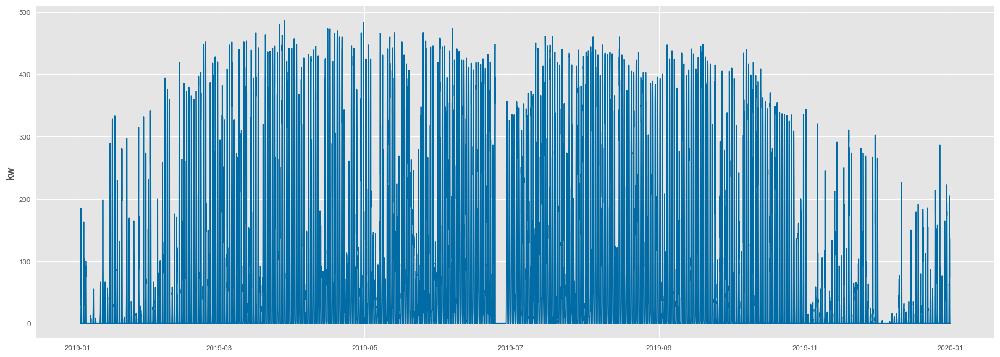

In [10]:
fig1 = plt.figure(figsize=(20, 7))
sns.lineplot(df_train, x=df_train.index, y='kw')

As for our Feature data, most things seem as expected. For example:
* Highly-random weather Features like 'cloud_total_mean' and 'precip_total_mean'
* Highly-periodic Features like 'altitude' and 'irradiation'

A couple strange behaviors stand out. For example:
* 12 of our Features have gaps in their values just prior to 2019-03 and 2019-07, and somewhere near 2019-12. This could be due to Nulls or missing rows.

C:\Users\gabor\AppData\Local\Temp\ipykernel_381808\1325033582.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_train.drop(columns=time_cols).plot(subplots=True, layout=(5,4), ax=ax)


array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object)

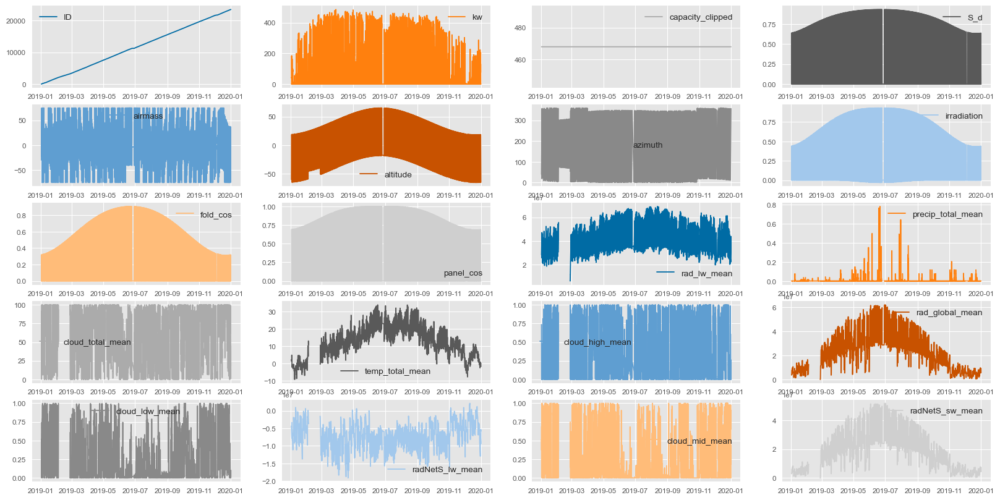

In [11]:
fig2, ax = plt.subplots(figsize=(20, 10))
df_train.drop(columns=time_cols).plot(subplots=True, layout=(5,4), ax=ax)

Let's follow with some surface-level correlation analysis, to see if there are any "unexpected" interactions.

:::Correlations to 'kw' target variable:::
kw                   1.000000
irradiation          0.851681
fold_cos             0.836732
panel_cos            0.822872
S_d                  0.787567
altitude             0.732397
temp_total_mean      0.325886
radNetS_lw_mean     -0.262036
radNetS_sw_mean      0.250168
rad_global_mean      0.248424
rad_lw_mean          0.242254
cloud_total_mean    -0.194734
cloud_low_mean      -0.194080
cloud_mid_mean      -0.148393
cloud_high_mean     -0.104435
airmass              0.097989
ID                  -0.060742
precip_total_mean   -0.057964
azimuth              0.002219
Name: kw, dtype: float64


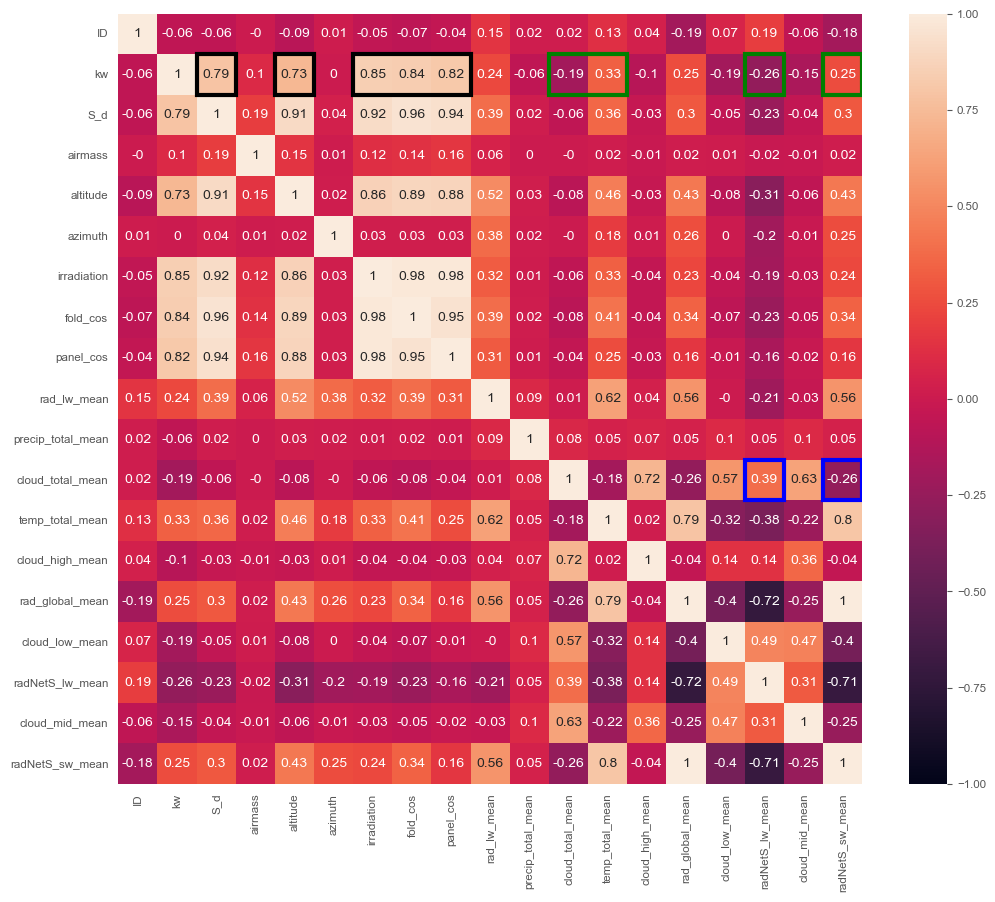

In [12]:
# Tabular representation
corr = df_train.drop(columns=['capacity_clipped']).corr(numeric_only=True)  # 'capacity_clipped' is constant, so dropped
kw_corrs = corr.kw
kw_corrs = kw_corrs.loc[kw_corrs.abs().sort_values(ascending=False).index]
print(f":::Correlations to 'kw' target variable:::")
print(kw_corrs)

# Graphical representation
fig3, ax = plt.subplots(figsize=(12,10))
ax = sns.heatmap(corr.round(2), annot=True, vmin=-1, vmax=1)

# obvious corrs to target
ax.add_patch(mpl.patches.Rectangle((2, 1), 1, 1, fill=False, edgecolor='black', lw=3))
ax.add_patch(mpl.patches.Rectangle((4, 1), 1, 1, fill=False, edgecolor='black', lw=3))
ax.add_patch(mpl.patches.Rectangle((6, 1), 3, 1, fill=False, edgecolor='black', lw=3))

# interesting corrs to target
ax.add_patch(mpl.patches.Rectangle((11, 1), 2, 1, fill=False, edgecolor='green', lw=3))
ax.add_patch(mpl.patches.Rectangle((16, 1), 1, 1, fill=False, edgecolor='green', lw=3))
ax.add_patch(mpl.patches.Rectangle((18, 1), 1, 1, fill=False, edgecolor='green', lw=3))

# interesting corrs "not target"
ax.add_patch(mpl.patches.Rectangle((16, 11), 1, 1, fill=False, edgecolor='blue', lw=3))
ax.add_patch(mpl.patches.Rectangle((18, 11), 1, 1, fill=False, edgecolor='blue', lw=3))

plt.show()

## Results so far (1)

We've got a few strong correlations to 'kw':
* irradiation : 0.851681
* fold_cos : 0.836732
* panel_cos : 0.822872
* S_d : 0.787567
* altitude : 0.732397

...and a few weak correlations:
* temp_total_mean : 0.325886
* radNetS_lw_mean : -0.262036
* radNetS_sw_mean : 0.250168
* rad_global_mean : 0.248424
* rad_lw_mean : 0.242254
* cloud_total_mean : -0.194734

For our strongly-correlated Features, there's not much interesting to be said at this point. The power and intensity of available radiation is obviously related to how many 'kW' can be produced from it via PV devices, and the capacity to capture those radiation qualities is directly related to angles of incidence on a given PV device.

A couple of weakly-correlated Features stand out, though.
1) 'temp_total_mean' is counter-intuitive as a positive correlation to 'kW'-production. Though variable in degree of effect, high temperatures are known to reduce PV efficiency. We'll take a look at this, it's possible 'temp_total_mean' is simply descriptive of, or secondary to, more impactful radiation data.
2) 'cloud_total_mean' is lower among our weak correlations to 'kw', but it has higher correlations with 'radNetS_lw_mean' and 'radNetS_sw_mean', which in turn are inversely- and directly-correlated to 'kw' more strongly than 'cloud_total_mean' itself. All of this is also true for 'cloud_low_mean', a direct component of 'cloud_total_mean'

These results mean that we will focus our investigations on the weakly-correlated Features, considering what we already know about the strongly-correlated Features.


We begin by exploring 'cloud_total_mean' and its influence on 'kW' production values. Further, we'll take a look at how the 'radNetS_lw_mean' and 'radNetS_sw_mean' Features interact with 'cloud_total_mean'.

Cloud cover does not visually appear to influence 'kW' throughout the year. There are plenty of periods of high total cloud cover AND high 'kW', as well as low total cloud cover AND low 'kW'.

Text(0.5, 0.92, 'kW Production & Total Cloud Cover')

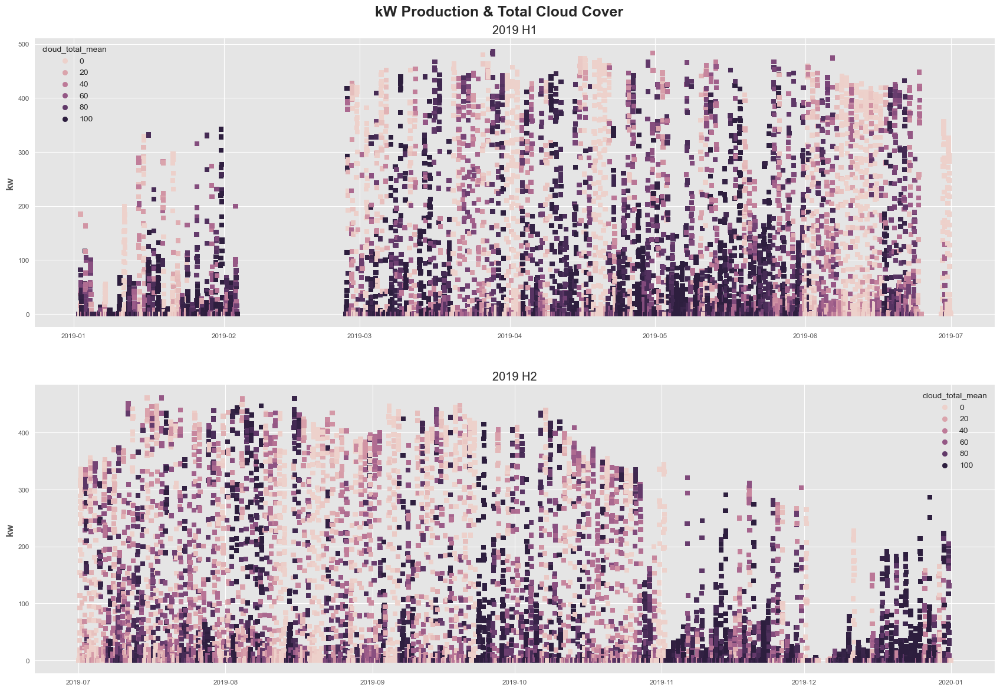

In [13]:
fig4, (ax1, ax2) = plt.subplots(2, 1, figsize=(21,14))
# 1st half of year
sns.scatterplot(df_train[:11372], x=df_train[:11372].index, y='kw', marker=',', linewidth=0, hue='cloud_total_mean', ax=ax1)
# 2nd half of year
sns.scatterplot(df_train[11372:], x=df_train[11372:].index, y='kw', marker=',', linewidth=0, hue='cloud_total_mean', ax=ax2)
ax1.set_title('2019 H1')
ax2.set_title('2019 H2')
fig4.suptitle('kW Production & Total Cloud Cover', y=0.92, fontsize=18, fontweight='bold')

Let's plot 'cloud_total_mean' and 'kW' together for more granularity.

It looks like our suspicions are well-founded, our feature/target distribution covers about all the possible interactions.

<Axes: xlabel='cloud_total_mean', ylabel='kw'>

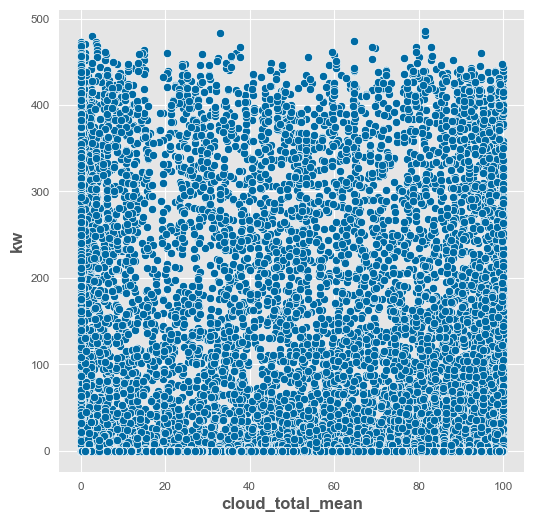

In [14]:
fig5 = plt.figure(figsize=(6,6))
sns.scatterplot(df_train, x='cloud_total_mean', y='kw')

Let's see if a smaller range of data provides more insight into 'cloud_total_mean'/'kW' behavior.

We'll observe some Summer and Winter data.

### Summer 'kW' & 'cloud_total_mean' Data

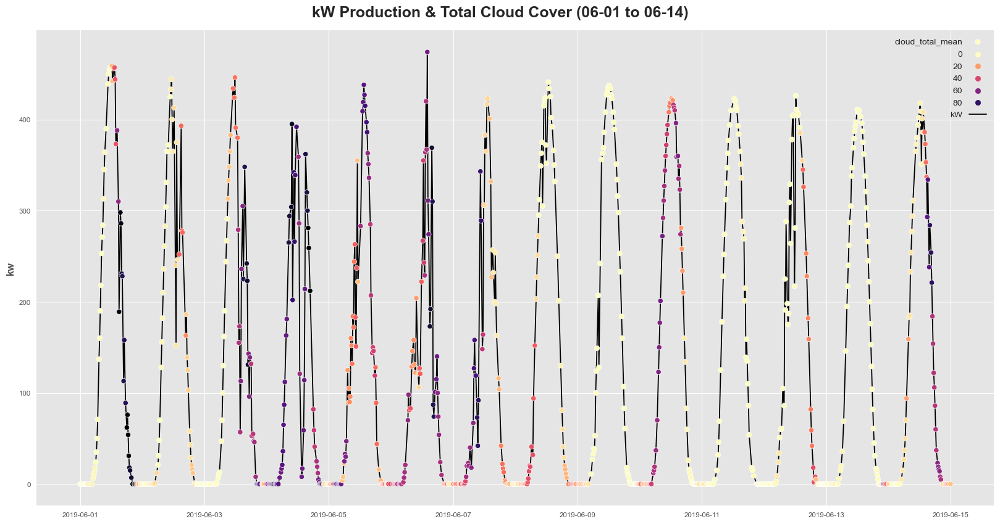

In [15]:
fig6 = plt.figure(figsize=(20,10))
# scatterplot of 'kw' values hued by 'cloud_total_mean'
sns.scatterplot(df_train.loc['2019-06-01 00:00:00' : '2019-06-15 00:00:00'],
             x=df_train.loc['2019-06-01 00:00:00' : '2019-06-15 00:00:00'].index, y='kw', label='cloud_total_mean', hue='cloud_total_mean', palette='magma_r', zorder=7)
# lineplot of the same for interpretation
sns.lineplot(df_train.loc['2019-06-01 00:00:00' : '2019-06-15 00:00:00'],
             x=df_train.loc['2019-06-01 00:00:00' : '2019-06-15 00:00:00'].index, y='kw', label='kW', color='black')

fig6.suptitle('kW Production & Total Cloud Cover (06-01 to 06-14)', y=0.92, fontsize=18, fontweight='bold')
plt.legend(markerfirst=False)

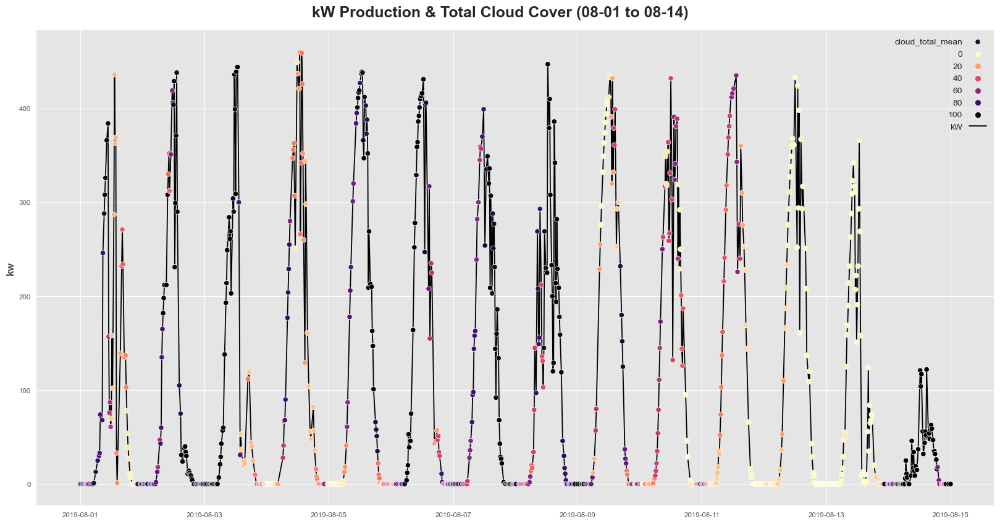

In [16]:
fig7 = plt.figure(figsize=(20,10))
# scatterplot of 'kw' values hued by 'cloud_total_mean'
sns.scatterplot(df_train.loc['2019-08-01 00:00:00' : '2019-08-15 00:00:00'],
             x=df_train.loc['2019-08-01 00:00:00' : '2019-08-15 00:00:00'].index, y='kw', label='cloud_total_mean', hue='cloud_total_mean', palette='magma_r', zorder=7)
# lineplot of the same for interpretation
sns.lineplot(df_train.loc['2019-08-01 00:00:00' : '2019-08-15 00:00:00'],
             x=df_train.loc['2019-08-01 00:00:00' : '2019-08-15 00:00:00'].index, y='kw', label='kW', color='black')

fig7.suptitle('kW Production & Total Cloud Cover (08-01 to 08-14)', y=0.92, fontsize=18, fontweight='bold')
plt.legend(markerfirst=False)

### Winter 'kW' & 'cloud_total_mean' Data

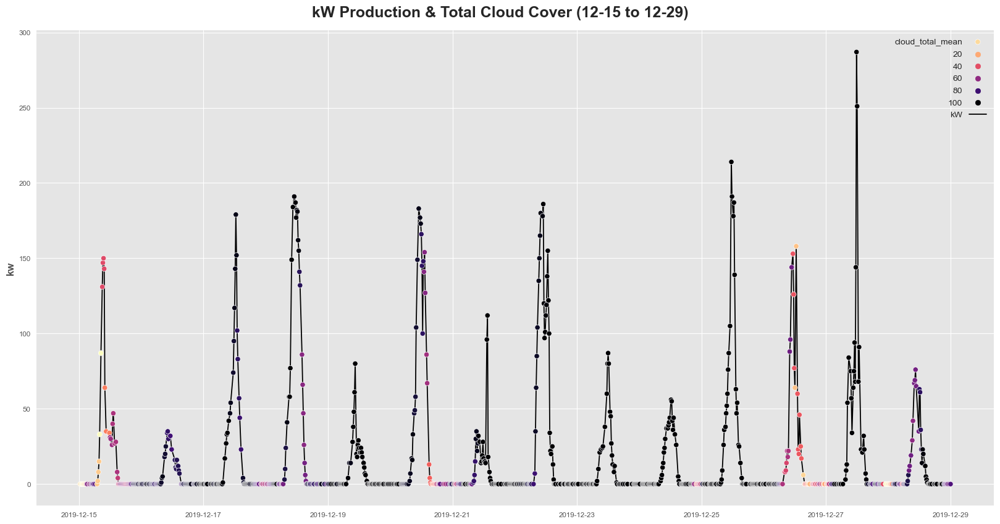

In [17]:
fig8 = plt.figure(figsize=(20,10))
# scatterplot of 'kw' values hued by 'cloud_total_mean'
sns.scatterplot(df_train.loc['2019-12-15 00:00:00' : '2019-12-29 00:00:00'],
             x=df_train.loc['2019-12-15 00:00:00' : '2019-12-29 00:00:00'].index, y='kw', label='cloud_total_mean', hue='cloud_total_mean', palette='magma_r', zorder=7)
# lineplot of the same for interpretation
sns.lineplot(df_train.loc['2019-12-15 00:00:00' : '2019-12-29 00:00:00'],
             x=df_train.loc['2019-12-15 00:00:00' : '2019-12-29 00:00:00'].index, y='kw', label='kW', color='black')

fig8.suptitle('kW Production & Total Cloud Cover (12-15 to 12-29)', y=0.92, fontsize=18, fontweight='bold')
plt.legend(markerfirst=False)

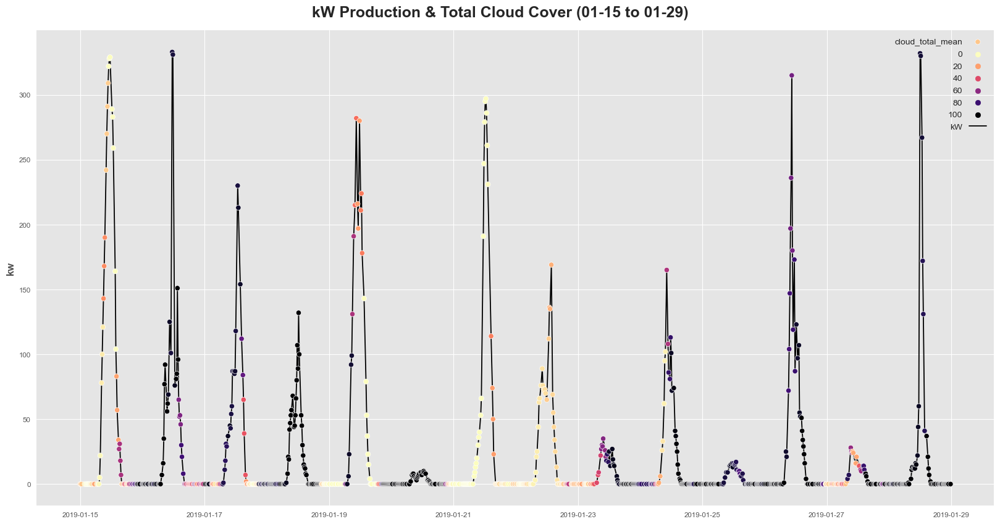

In [18]:
fig9 = plt.figure(figsize=(20,10))
# scatterplot of 'kw' values hued by 'cloud_total_mean'
sns.scatterplot(df_train.loc['2019-01-15 00:00:00' : '2019-01-29 00:00:00'],
             x=df_train.loc['2019-01-15 00:00:00' : '2019-01-29 00:00:00'].index, y='kw', label='cloud_total_mean', hue='cloud_total_mean', palette='magma_r', zorder=7)
# lineplot of the same for interpretation
sns.lineplot(df_train.loc['2019-01-15 00:00:00' : '2019-01-29 00:00:00'],
             x=df_train.loc['2019-01-15 00:00:00' : '2019-01-29 00:00:00'].index, y='kw', label='kW', color='black')

fig9.suptitle('kW Production & Total Cloud Cover (01-15 to 01-29)', y=0.92, fontsize=18, fontweight='bold')
plt.legend(markerfirst=False)

There's a good amount to unpack from these plots.

If we think about the way solar-position cycles change throughout the year, there are quite a few factors we are not visualizing or accounting for alongside 'cloud_total_mean' that influence 'kW' production values. **However**, there's an important trend we see throughout the year relating 'cloud_total_mean' and 'kW'.

'cloud_total_mean' levels appear to affect the **variability** in 'kW' values. The higher total cloud cover is, the more consistently we see jagged, inconsistent changes in 'kW' values throughout a given day. 06-01 and 06-06 from the first graph demonstrate this quite well. They peak at similar 'kW' values, but the first half of 06-01 is cloudless, while the second half highly-cloudy and becomes irregular. Meanwhile, 06-06 is somewhat cloudy and jagged in the first half of the day and, as it becomes even cloudier, becomes more jagged and irregular.

It is not impossible to have cloudy, highly-productive days as shown by most of the month of August (08), but we can also make a reasonable guess that Total 'kW' production in a given day would be higher on cloudless days, as 'kW' ramps up and down from expected maxima smoothly.

### **With all this in mind, we'll include 'cloud_total_mean' in our modeling since it captures important variation in 'kW'.**
This comes with some pros and cons:
* Pros:
    * If we model in a way that handles Nulls, we have less of a need to fill or impute them for any "missing" data points.
    * XGBoost becomes available as a popular, effective basis for modeling that can handle NaN-values.
    * SciKitLearn's HistGradientBoosting approach will be its competition, as it claims to handle NaN's in a more effective manner.
* Cons:
    * Once we get to the "full extent" of the reconstruction of our Time Series, we'll have a larger number of NaN's present due to their inclusion in our modeling and prediction techniques. This could affect our imputed 'kW' data.
    * If we were to decide to fill weather NaN's, that work would likely be a lot of effort for not much benefit, considering the highly-complex, even chaotic, nature of weather data.
    * Including weather data in our modeling would restrict possibilities of Forecasting from our Reconstructed Time Series greatly. Forecasting weather data in the first place, in order to then Forecast 'kW' data, is a huge challenge, and rarely provides data horizons beyond even 1 Week for a given location.

Let's now take a quick look at how 'cloud_total_mean', 'radNetS_lw_mean', and 'radNetS_sw_mean' interact.

We'll start with a quick look at how 'radNetS_lw_mean' and 'radNetS_sw_mean'.

<Axes: xlabel='radNetS_sw_mean', ylabel='radNetS_lw_mean'>

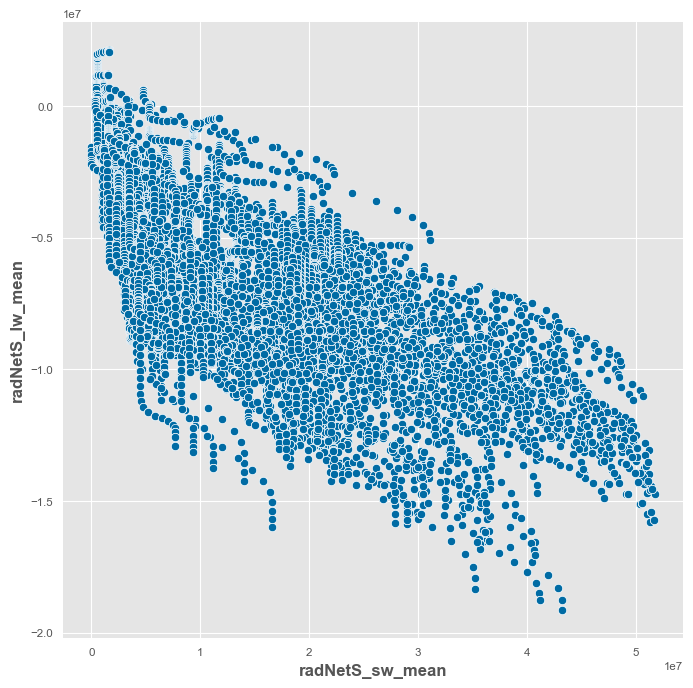

In [19]:
fig10 = plt.figure(figsize=(8,8))

sns.scatterplot(df_train, x='radNetS_sw_mean', y='radNetS_lw_mean')

This clearly shows a that as 'radNetS_sw_mean' grows more positive, 'radNetS_lw_mean' grows more negative. **However**, it's important to understand that 'radNetS_lw_mean' radiation is recorded as negative as it is generally "opposite in direction" from 'radNetS_sw_mean', but that the absolute amount of radiation is, in fact, increasing for both Features. This means these features are actually Directly Correlated, and there's no odd interaction, such as one type of radiation increasing while the other decreases, between them.

**This also means our understanding of both 'cloud_total_mean' and 'kW' as they relate to these two is actually straightforward as well. The more Longwave and Shortwave radiation available, the higher 'kW' tends to be. These can then be taken as Descriptive Statistics about the position or availability of Solar radiation, meaning we likely don't need to include them and can rely on 'cloud_total_mean' as a regulator of that radiation instead.**

Let's now look at 'temp_total_mean', which we identified earlier might need investigation.

<Axes: xlabel='temp_total_mean', ylabel='kw'>

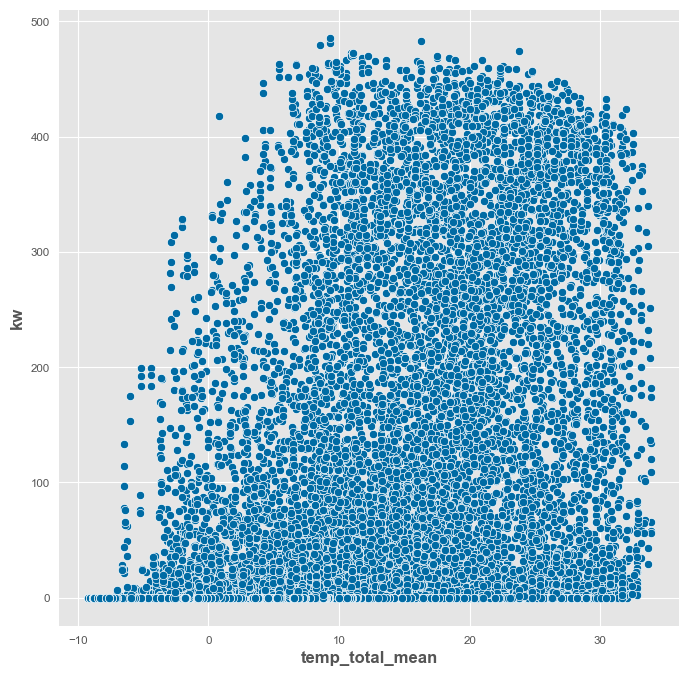

In [20]:
fig11 = plt.figure(figsize=(8,8))
sns.scatterplot(df_train, x='temp_total_mean', y='kw')

From a simple scatter we can see a few things:
1) The 'kW' maximum does appear to decrease slightly as the 'temp_total_mean' increases from ~10 degrees Celsius. However, this is a relatively small change considering the total range of 'kW' values at positive Temperatures.
2) "Low" temperatures (let's say <15C) still exhibit high 'kW' values.
3) At this range of temperatures, we are essentially unable to tell if further temperature increases would further decrease 'kW' maxima.

We should consider that Temperature is **very** closely related to the intensity and availability of radiation, which is clear from its high correlations to 'rad_global_mean' and 'radNetS_sw_mean' which are all available radiation and Solar radiation, respectively. In fact, we know it is caused by that radiation (and other Earthly weather factors), and is therefore another Descriptive Statistic that we can likely forgo in modeling.

With the few questionable Features better understood, let's go ahead and attempt some modeling!

### ------------------------------------------------------------------------------------------------------
# Modeling : First Pass
### ------------------------------------------------------------------------------------------------------

In [21]:
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor

In [22]:
# import and instantiate our models
hgb_reg = HistGradientBoostingRegressor(random_state=432,
                                        max_iter=10000,
                                        learning_rate=0.01,
                                        max_depth=5,
                                        early_stopping=True,
                                        loss='absolute_error')
xgb_reg = XGBRegressor(random_state=432,
                       n_estimators= 10000, 
                       learning_rate= 0.01,
                       max_depth=5, 
                       early_stopping_rounds= 100,
                       eval_metric= ['mae']
                       )

In [23]:
# Create Train-Test Split 
X_train, X_val, y_train, y_val = train_test_split(df_train,
                                                  df_train.kw,
                                                  test_size=0.2,
                                                  shuffle=True,
                                                  random_state=432
                                                  )

In [24]:
# Fit both models, ensuring we only train on the "relevant" features we instantiate here
features_1 = ['S_d', 'altitude', 'irradiation','fold_cos', 'panel_cos', 'cloud_total_mean']

hgb_reg.fit(X=X_train[features_1],
            y=y_train
            )
xgb_reg.fit(X=X_train[features_1],
            y=y_train, 
            eval_set = [(X_train[features_1], y_train), (X_val[features_1], y_val)], 
            verbose= 250
            )

# XGB's integrated validation will be here

[0]	validation_0-mae:97.08676	validation_1-mae:96.80017
[250]	validation_0-mae:31.40437	validation_1-mae:32.04511
[500]	validation_0-mae:26.59884	validation_1-mae:28.02297
[750]	validation_0-mae:25.56730	validation_1-mae:27.50703
[1000]	validation_0-mae:24.92419	validation_1-mae:27.43716
[1130]	validation_0-mae:24.62015	validation_1-mae:27.43311


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=['mae'], feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None, random_state=432, ...)

In [25]:
# "Manually" validate our HGB
hgb_cv_scores = cross_val_score(estimator=hgb_reg,
                                X=X_train[features_1],
                                y=y_train,
                                cv=5,
                                scoring="neg_mean_absolute_error")

print(f'HGB CV-Scores: {hgb_cv_scores}')
print(np.mean(hgb_cv_scores))

HGB CV-Scores: [-27.72586154 -28.22837558 -28.13218067 -27.97115996 -27.56895492]
-27.925306533494375


In [26]:
hgb_preds = hgb_reg.predict(X_val[features_1])
xgb_preds = xgb_reg.predict(X_val[features_1])

Text(0.5, 1.0, 'XGB Actual vs Predicted')

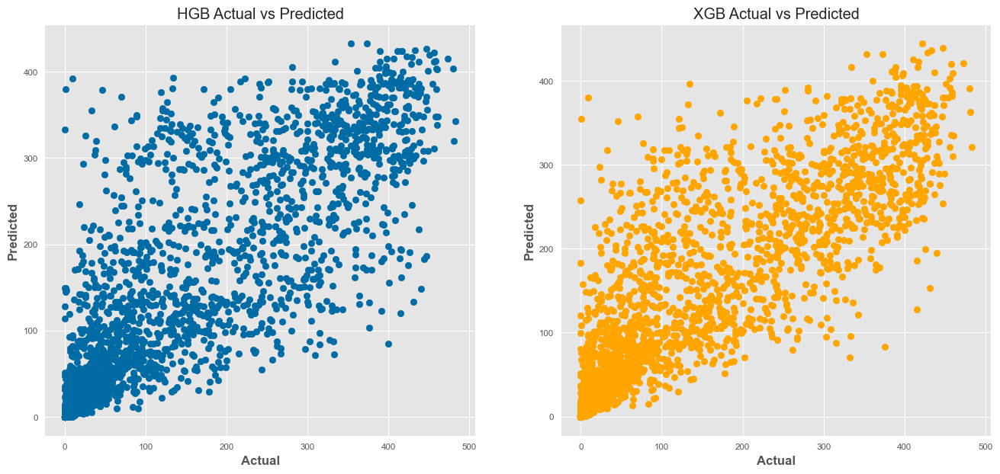

In [27]:
# Visualizing the behavior of both our models
fig12, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
ax1.scatter(y_val, hgb_preds)
ax2.scatter(y_val, xgb_preds, color='orange')
ax1.set_xlabel('Actual')
ax2.set_xlabel('Actual')
ax1.set_ylabel('Predicted')
ax2.set_ylabel('Predicted')
ax1.set_title("HGB Actual vs Predicted")
ax2.set_title("XGB Actual vs Predicted")

Text(0.5, 1.0, 'XGB Actual vs Predicted')

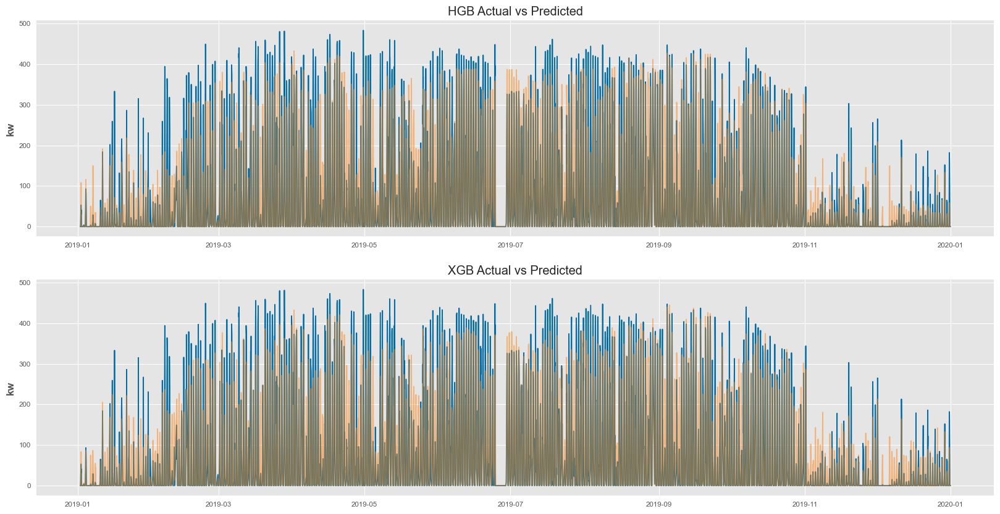

In [28]:
fig13, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))
sns.lineplot(x=y_val.index, y=y_val, ax=ax1)
sns.lineplot(x=y_val.index, y=hgb_preds, alpha=0.5, ax=ax1)
sns.lineplot(x=y_val.index, y=y_val, ax=ax2)
sns.lineplot(x=y_val.index, y=xgb_preds, alpha=0.5, ax=ax2)
ax1.set_title("HGB Actual vs Predicted")
ax2.set_title("XGB Actual vs Predicted")

### Evaluating (1)
Our first attempt at modeling actually isn't half bad.

MAE for both hovers ~28 off of targets, and we have some vague linearity in our spread of Actuals vs. Predicted.

* HGB seems to cluster around low- and high-valued Actuals and Predictions, while having more trouble with middling values. It also appears to under-predict with more severity.
* XGB starts off a bit stronger with a more linear trend in Actuals vs Predictions and less severe under- and over-predictions.

### ------------------------------------------------------------------------------------------------------
# Modeling : Second Pass
### ------------------------------------------------------------------------------------------------------

There are a few things we can do to improve our modeling, such as GridSearch-ing for model hyperparameters or stratifying our Train-Test Split by some useful Feature such as the Month of the year.

Before we go ahead and "brute-force" with a GridSearch, let's see if we can re-engineer how Time is represented in our data, and re-model with the same hyperparameters, to see if giving the models a more "cyclical" idea of the way time flows helps. This should be particularly impactful as it relates to monthly changes and understanding seasons.

Another way to think of the "cyclical" nature of Time is as a literal circle for a given scale of time. The sin() and cos() "components" of Time would represent the "position" of a given point in time in a Day, Month, or Year, and would create a numerical proximity between, for example, End of Day 1 and Beginning of Day 2.

Additionally, since we know that Daytime is when 'kW' actually becomes positive (and therefore worth modeling), we could also create angular representations of the "position" of the 'sunrise' and 'sunset' Time Features, depending on what behavior we see surrounding Nighttime.

In [29]:
### Some important notes about available Time information in our dataset

## In total, we can access:
# Day of Year
# Day Month
# Day of Week
# Hour
# Minute
# Second
# Millisecond (only from 'sunrise'/'sunset', which is fixed for a given day)

# Millisecond is unlikely to be a useful gradation of time as 'sunrise' and 'sunset',
# though likely important factors, appear to always have a minimum of 1-second change,
# and derive their use from creating "bounds" for daytime and nighttime.
# Additionally, we could likely model the degree of change in both 'sunrise' and 'sunset'
# throughout the year in order to fill gap data which we know exists.

In [30]:
# Our first task in transforming time will be to separate out the individual units of time

# For the hours, we'll need to take a two-step approach to create a format like "hour + minute_fraction" as a float,
# which will provide more accurate time-location when we transform 

# Fetch new time labels from 'start' with func
def new_time_labels(df):
    """
    Takes a Dataframe with DatetimeIndex and creates new time labels based on DataFrame index.
    :param df: input 'df' with DatetimeIndex
    :return: input 'df' with new DatetimeIndex and multiple time label columns
    """
    # # Re-index from datetime object 'start'
    # df = df.copy()
    # df = df.set_index(df['start'])
    # New, standard time components
    df['minute'] = df.index.minute
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.day_of_week
    df['dayofyear'] = df.index.day_of_year
    df['month'] = df.index.month
    # Fractional-hour float for our 15-min resolution, combining 'hour' and 'minute'
    df['hour_frac'] = df['hour'] + (df['minute'] / 60)
    
    return df

df_train = new_time_labels(df_train)
df_test = new_time_labels(df_test)

In [31]:
# Then drop old, redundant time labels
def drop_old_time(df):
    old_time_cols = ['time_hourly', 'day', 'hour', 'minute']

    df.drop(columns=old_time_cols, inplace=True)
    return df

df_train = drop_old_time(df_train)
df_test = drop_old_time(df_test)

In [32]:
# Now, we have information formatted such that we can apply our sin- and cos-transforms to produce
# the "location" of a datapoint in the cycle of hours, days, months, and years

from sklearn.preprocessing import FunctionTransformer

def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(x / period * 2 * np.pi))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(x / period * 2 * np.pi))


def cyclical_transform(df):
    """
    Transform 'hour_frac', 'month', 'dayofweek', and 'dayofyear' into circular-position components.
    This creates numeric, cyclical representations of time which an ML model can learn.
    :param df: input 'df' containing time series features 'hour_frac', 'month', 'dayofweek', and 'dayofyear'
    :return: input 'df' with new sin()- and cos()-transformed time series features
    """
    # Standard "hour" period, our 15min resolution integrates with no problems through 'hour_frac'
    df['hour_sin'] = sin_transformer(24).fit_transform(df.hour_frac)
    df['hour_cos'] = cos_transformer(24).fit_transform(df.hour_frac)
    
    # Standard "month" resolution
    df['month_sin'] = sin_transformer(12).fit_transform(df.month)
    df['month_cos'] = cos_transformer(12).fit_transform(df.month)
    
    # Standard "day-of-week" resolution
    df['dayofwk_sin'] = sin_transformer(7).fit_transform(df.dayofweek)
    df['dayofwk_cos'] = cos_transformer(7).fit_transform(df.dayofweek)
    
    # Period is 366 to account for leap years
    df['dayofyr_sin'] = sin_transformer(366).fit_transform(df.dayofyear)
    df['dayofyr_cos'] = cos_transformer(366).fit_transform(df.dayofyear)
    
    return df

df_train = cyclical_transform(df_train)
df_test = cyclical_transform(df_test)

### Visualizing our Transformation

In [33]:
# Let's take a look at the results of our transformations
df_train

,ID,start,kw,capacity_clipped,S_d,airmass,altitude,azimuth,irradiation,fold_cos,...,month,hour_frac,hour_sin,hour_cos,month_sin,month_cos,dayofwk_sin,dayofwk_cos,dayofyr_sin,dayofyr_cos
2019-01-02 01:00:00,0,2019-01-02 01:00:00,0.0,468.0,0.0,-1.153310,-60.119844,39.300368,0.0,-0.0,...,1,1.00,0.258819,0.965926,5.000000e-01,0.866025,0.974928,-0.222521,0.034328,0.999411
2019-01-02 01:15:00,1,2019-01-02 01:15:00,0.0,468.0,0.0,-1.173570,-58.440884,45.209051,0.0,-0.0,...,1,1.25,0.321439,0.946930,5.000000e-01,0.866025,0.974928,-0.222521,0.034328,0.999411
2019-01-02 01:45:00,2,2019-01-02 01:45:00,0.0,468.0,0.0,-1.226941,-54.590829,55.621305,0.0,-0.0,...,1,1.75,0.442289,0.896873,5.000000e-01,0.866025,0.974928,-0.222521,0.034328,0.999411
2019-01-02 02:45:00,3,2019-01-02 02:45:00,0.0,468.0,0.0,-1.398963,-45.628041,72.112254,0.0,-0.0,...,1,2.75,0.659346,0.751840,5.000000e-01,0.866025,0.974928,-0.222521,0.034328,0.999411
2019-01-02 03:00:00,4,2019-01-02 03:00:00,0.0,468.0,0.0,-1.459987,-43.230706,75.591904,0.0,-0.0,...,1,3.00,0.707107,0.707107,5.000000e-01,0.866025,0.974928,-0.222521,0.034328,0.999411
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 22:15:00,23460,2019-12-31 22:15:00,0.0,468.0,0.0,-1.156434,-59.851534,319.039795,0.0,-0.0,...,12,22.25,-0.442289,0.896873,-2.449294e-16,1.000000,0.781831,0.623490,-0.017166,0.999853
2019-12-31 22:30:00,23461,2019-12-31 22:30:00,0.0,468.0,0.0,-1.139165,-61.382367,325.341758,0.0,-0.0,...,12,22.50,-0.382683,0.923880,-2.449294e-16,1.000000,0.781831,0.623490,-0.017166,0.999853
2019-12-31 23:00:00,23462,2019-12-31 23:00:00,0.0,468.0,0.0,-1.115452,-63.701449,339.466225,0.0,-0.0,...,12,23.00,-0.258819,0.965926,-2.449294e-16,1.000000,0.781831,0.623490,-0.017166,0.999853
2019-12-31 23:15:00,23463,2019-12-31 23:15:00,0.0,468.0,0.0,-1.108683,-64.418371,347.182472,0.0,-0.0,...,12,23.25,-0.195090,0.980785,-2.449294e-16,1.000000,0.781831,0.623490,-0.017166,0.999853


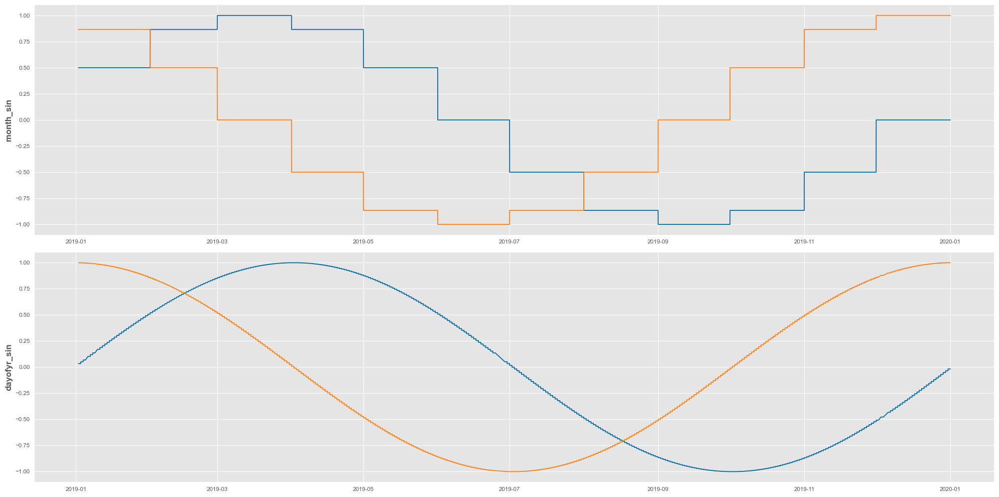

In [34]:
fig_cycle, ax = plt.subplots(2, 1, figsize=(20,10))
# Visualize 'month' by sin(), cos() transform
sns.lineplot(x=df_train.index, y=df_train.month_sin, ax=ax[0])
sns.lineplot(x=df_train.index, y=df_train.month_cos, ax=ax[0])
# Visualize 'day of year' by sin(), cos() transform
sns.lineplot(x=df_train.index, y=df_train.dayofyr_sin, ax=ax[1])
sns.lineplot(x=df_train.index, y=df_train.dayofyr_cos, ax=ax[1])

plt.tight_layout()
plt.show()

As shown above, the measure of Distance is now something we can apply to Time, where nearby Months or Days are similarly-valued, regardless of whether they are at the beginning or end of a given Time cycle.

Let's apply this to the modeling.

In [35]:
# Create new Train-Test Split, and stratify by newly-added 'month' Feature
X_train2, X_val2, y_train2, y_val2 = train_test_split(df_train,
                                                  df_train.kw,
                                                  test_size=0.2,
                                                  shuffle=True,
                                                  stratify=df_train['month'],
                                                  random_state=432
                                                  )

In [36]:
# Create new Features list with Cyclical Time
features_2 = features_1 + ['hour_sin', 'hour_cos', 'dayofwk_sin', 'dayofwk_cos', 'month_sin', 'month_cos', 'dayofyr_sin', 'dayofyr_cos']

# Instantiate new models
hgb_reg2 = HistGradientBoostingRegressor(random_state=432,
                                        max_iter=10000,
                                        learning_rate=0.01,
                                        max_depth=5,
                                        early_stopping=True,
                                        loss='absolute_error')
xgb_reg2 = XGBRegressor(random_state=432,
                       n_estimators= 10000, 
                       learning_rate= 0.01,
                       max_depth=5, 
                       early_stopping_rounds= 100,
                       eval_metric= ['mae']
                       )

# Fit
hgb_reg2.fit(X=X_train2[features_2],
            y=y_train2
            )
xgb_reg2.fit(X=X_train2[features_2],
            y=y_train2, 
            eval_set = [(X_train2[features_2], y_train2), (X_val2[features_2], y_val2)], 
            verbose= 250
            )

# XGB's integrated validation here

[0]	validation_0-mae:96.91925	validation_1-mae:96.84682
[250]	validation_0-mae:29.30432	validation_1-mae:30.08910
[500]	validation_0-mae:23.00186	validation_1-mae:24.20916
[750]	validation_0-mae:21.72827	validation_1-mae:23.22935
[1000]	validation_0-mae:20.59724	validation_1-mae:22.32939
[1250]	validation_0-mae:19.66990	validation_1-mae:21.73363
[1500]	validation_0-mae:18.86066	validation_1-mae:21.15585
[1750]	validation_0-mae:18.15820	validation_1-mae:20.77227
[2000]	validation_0-mae:17.51402	validation_1-mae:20.38305
[2250]	validation_0-mae:16.98683	validation_1-mae:20.14182
[2500]	validation_0-mae:16.48450	validation_1-mae:19.89093
[2750]	validation_0-mae:15.99539	validation_1-mae:19.61478
[3000]	validation_0-mae:15.50184	validation_1-mae:19.34954
[3250]	validation_0-mae:15.04682	validation_1-mae:19.14176
[3500]	validation_0-mae:14.66889	validation_1-mae:18.94357
[3750]	validation_0-mae:14.24565	validation_1-mae:18.74378
[4000]	validation_0-mae:13.89272	validation_1-mae:18.60039
[42

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=['mae'], feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None, random_state=432, ...)

In [37]:
hgb2_cv_scores = cross_val_score(estimator=hgb_reg2,
                                X=X_train2[features_2],
                                y=y_train2,
                                cv=5,
                                scoring="neg_mean_absolute_error")

print(f'HGB CV-Scores: {hgb2_cv_scores}')
print(np.mean(hgb2_cv_scores))

HGB CV-Scores: [-22.65810791 -25.04832682 -23.86111087 -24.17447646 -23.12620562]
-23.77364553483565


In [38]:
# Create predictions from V2 of Models and repeat Viz
hgb_preds2 = hgb_reg2.predict(X_val2[features_2])
xgb_preds2 = xgb_reg2.predict(X_val2[features_2])

Text(0.5, 1.0, 'XGB_2 Actual vs Predicted')

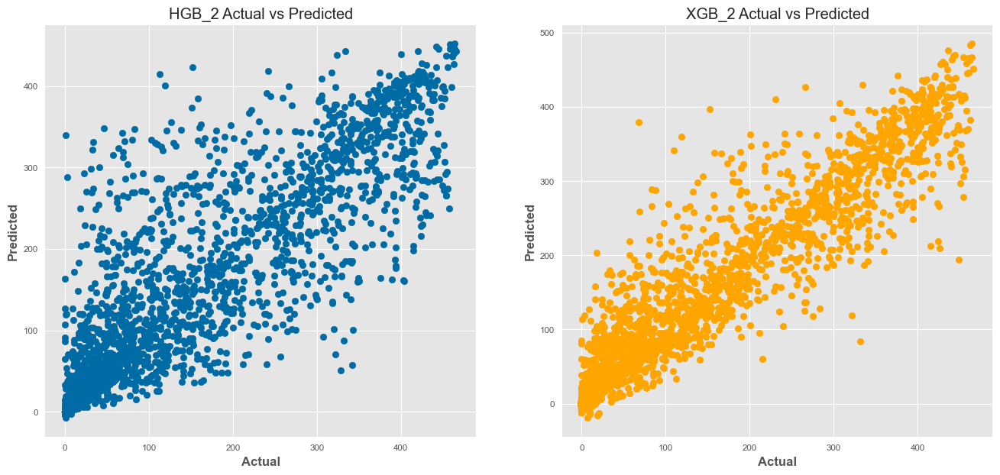

In [39]:
# Visualizing the behavior of both our models
fig14, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
ax1.scatter(y_val2, hgb_preds2)
ax2.scatter(y_val2, xgb_preds2, color='orange')
ax1.set_xlabel('Actual')
ax2.set_xlabel('Actual')
ax1.set_ylabel('Predicted')
ax2.set_ylabel('Predicted')
ax1.set_title("HGB_2 Actual vs Predicted")
ax2.set_title("XGB_2 Actual vs Predicted")

Text(0.5, 1.0, 'XGB_2 Actual vs Predicted')

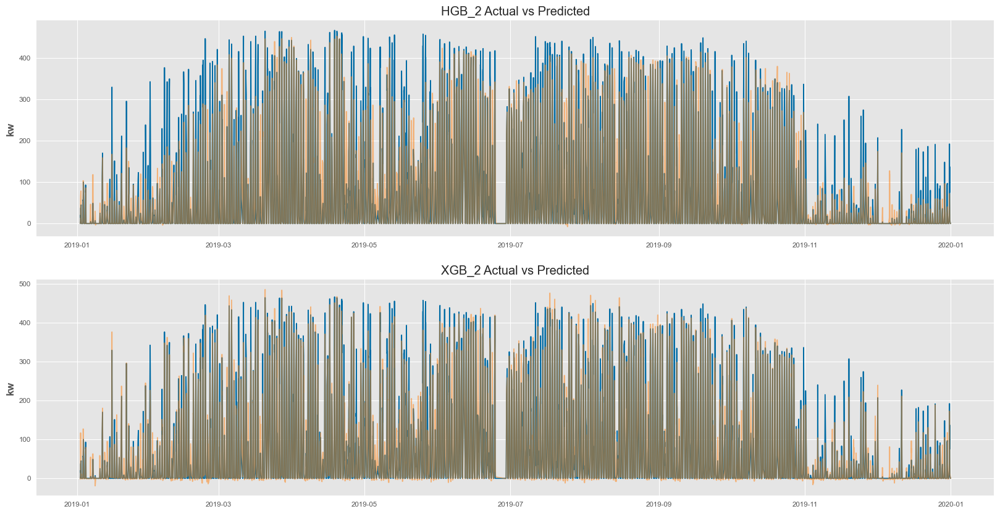

In [40]:
fig15, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))
sns.lineplot(x=y_val2.index, y=y_val2, ax=ax1)
sns.lineplot(x=y_val2.index, y=hgb_preds2, alpha=0.5, ax=ax1)
sns.lineplot(x=y_val2.index, y=y_val2, ax=ax2)
sns.lineplot(x=y_val2.index, y=xgb_preds2, alpha=0.5, ax=ax2)
ax1.set_title("HGB_2 Actual vs Predicted")
ax2.set_title("XGB_2 Actual vs Predicted")

### Evaluating (2)
Our second attempt at modeling is much improved! Linearity is notably increased in both HGB and XGB as a result of including our Cyclical Time Features.

Numerically:
* HGB saw a decrease in MAE of ~4 kW, a reduction of ~14%.
* XGB saw a huge decrease in MAE of ~11 kW, a reduction of ~40%.

Qualitatively:
* HGB has improved quite a bit as far as under-predictions go. Across the length of the year we see a greater degree of overlap in high-valued Actual 'kW' production and Predictions.
* XGB has reined in its under- and over-predictions substantially. We see very good linearity in Actual vs Predicted 'kW' values, as well as a greater degree of overlap across the length of the year. **However**, we have new behavior where XGB is predicting Negative 'kW' values consistently. These are almost certainly occurring during Nighttime, and they have a some importance for us:
    * Even with the occurrence of these regular under-predictions, XGB's MAE for this run was a massive improvement, clearly offsetting whatever increased error is found here.
    * Conversely, it's possible these Nighttime values are still skewing our MAE lower than it actually is, even though they tend to be more incorrect than in our previous model.
    * It's clear from our above Scatterplots that negative under-predictions don't occur beyond ~20 kW Actual values, but we might benefit from more insight on how Features behave at these points.

We could argue there's more information the models need about the lower-bound of 'kW' values, but considering how much our MAE improved anyway (with XGB in particular), as well as how easily we could filter Nighttime values post-modeling, we're likely better off investigating how we can improve predictions more broadly and how NaN's influence our work.

### ------------------------------------------------------------------------------------------------------
# Error Analysis
### ------------------------------------------------------------------------------------------------------

### NaN-input Error Instances
We'll start with analyzing what type of error we encounter with NaN input values.

In [41]:
# Check where our NaN values exist and how many there are
df_train.isna().sum()

ID                      0
start                   0
kw                      0
capacity_clipped        0
S_d                     0
airmass                 0
altitude                0
azimuth                 0
irradiation             0
fold_cos                0
panel_cos               0
sunrise                 0
sunset                  0
rad_lw_mean          1116
precip_total_mean    5517
cloud_total_mean     1116
temp_total_mean      1116
cloud_high_mean      1116
rad_global_mean      1116
cloud_low_mean       1116
radNetS_lw_mean      1116
cloud_mid_mean       1116
radNetS_sw_mean      1116
dayofweek               0
dayofyear               0
month                   0
hour_frac               0
hour_sin                0
hour_cos                0
month_sin               0
month_cos               0
dayofwk_sin             0
dayofwk_cos             0
dayofyr_sin             0
dayofyr_cos             0
dtype: int64

In [42]:
# Let's look at NaN behavior as it relates to our predictions by filtering our data
# First we grab our 'X_val2' set, in order to add some new info to it

# Grab 'X_val2'
df_val2 = X_val2
# Create row for Actual 'kW' values from 'y_val2'
df_val2['y_val'] = y_val2

# Create columns for predicted values from both models
df_val2['hgb2_preds'] = hgb_preds2
df_val2['xgb2_preds'] = xgb_preds2
# Create columns for differences between Actuals and Predictions
df_val2['hgb_diff'] = y_val2 - hgb_preds2
df_val2['xgb_diff'] = y_val2 - xgb_preds2

In [43]:
# Grab rows with NaN's present in 'cloud_total_mean', which is the only kind of NaN we're modeling currently
Val2_NAN = df_val2[df_val2['cloud_total_mean'].isna()]

# Val2_NAN['over_under'] = np.where(Val2_NAN['pred_diff'] < -100,
#                                      'over',
#                                      np.where(Val2_NAN['pred_diff'] > 100,
#                                               'under',
#                                               'null')
#                                      )
Val2_NAN

,ID,start,kw,capacity_clipped,S_d,airmass,altitude,azimuth,irradiation,fold_cos,...,month_cos,dayofwk_sin,dayofwk_cos,dayofyr_sin,dayofyr_cos,y_val,hgb2_preds,xgb2_preds,hgb_diff,xgb_diff
2019-02-06 10:15:00,2217,2019-02-06 10:15:00,350.0,468.0,0.690536,2.652098,22.151692,155.231106,0.481406,0.377060,...,0.5,0.974928,-0.222521,0.593327,0.804962,350.0,160.111945,282.713074,189.888055,67.286926
2019-02-07 20:15:00,2297,2019-02-07 20:15:00,0.0,468.0,0.000000,-1.719089,-35.570448,287.269498,0.000000,-0.000000,...,0.5,0.433884,-0.900969,0.607058,0.794658,0.0,0.000022,1.370946,-0.000022,-1.370946
2019-02-13 09:00:00,2577,2019-02-13 09:00:00,53.0,468.0,0.611257,3.400700,17.101006,136.518682,0.342060,0.294057,...,0.5,0.974928,-0.222521,0.685548,0.728028,53.0,86.074449,145.273636,-33.074449,-92.273636
2019-02-19 20:00:00,2913,2019-02-19 20:00:00,0.0,468.0,0.000000,-1.984464,-30.259323,286.968633,0.000000,-0.000000,...,0.5,0.781831,0.623490,0.756771,0.653680,0.0,0.000022,-0.176960,-0.000022,0.176960
2019-02-12 13:00:00,2536,2019-02-12 13:00:00,178.0,468.0,0.731504,2.320891,25.522727,198.648546,0.549984,0.430869,...,0.5,0.781831,0.623490,0.672949,0.739689,178.0,140.019377,262.567017,37.980623,-84.567017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-02-09 10:00:00,2377,2019-02-09 10:00:00,29.0,468.0,0.686593,2.685810,21.859212,151.169453,0.467610,0.372327,...,0.5,-0.974928,-0.222521,0.633978,0.773351,29.0,118.578797,55.185181,-89.578797,-26.185181
2019-02-08 08:00:00,2316,2019-02-08 08:00:00,74.0,468.0,0.375257,6.991337,8.223458,124.713702,0.138031,0.143034,...,0.5,-0.433884,-0.900969,0.620609,0.784120,74.0,39.398064,45.727455,34.601936,28.272545
2019-02-09 10:30:00,2379,2019-02-09 10:30:00,33.0,468.0,0.713661,2.460977,23.975298,158.682456,0.519549,0.406343,...,0.5,-0.974928,-0.222521,0.633978,0.773351,33.0,123.059457,49.293407,-90.059457,-16.293407
2019-02-09 21:15:00,2410,2019-02-09 21:15:00,0.0,468.0,0.000000,-1.436190,-44.129827,302.452082,0.000000,-0.000000,...,0.5,-0.974928,-0.222521,0.633978,0.773351,0.0,0.000022,-4.895125,-0.000022,4.895125


Text(0.5, 1.0, 'XGB_2 Actual vs Predicted (NaN cloud)')

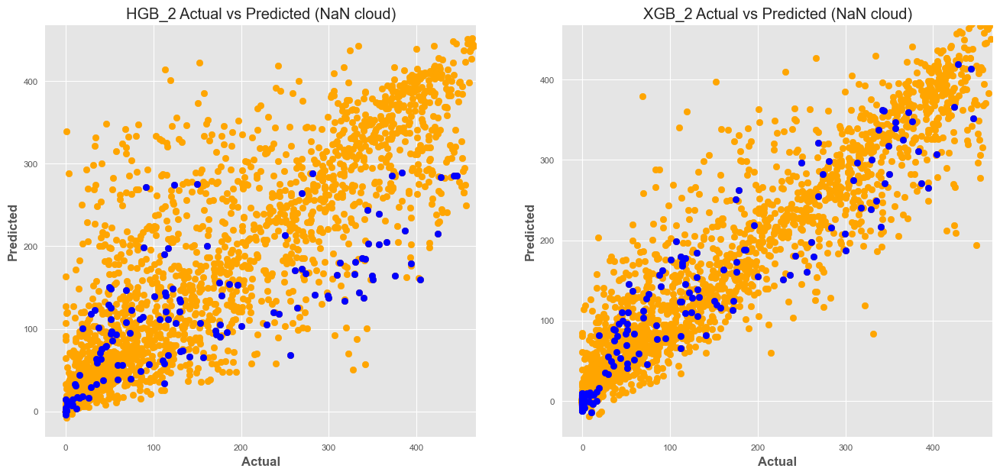

In [44]:
# Visualizing the behavior of both our models where 'cloud_total_mean' is NaN
fig16, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
ax1.scatter(y_val2, hgb_preds2, color='orange')
ax2.scatter(y_val2, xgb_preds2, color='orange')
ax1.scatter(Val2_NAN['y_val'], Val2_NAN['hgb2_preds'], color='b')
ax2.scatter(Val2_NAN['y_val'], Val2_NAN['xgb2_preds'], color='b')

ax1.set_xlim(right=468)
ax1.set_ylim(top=468)
ax2.set_xlim(right=468)
ax2.set_ylim(top=468)

ax1.set_xlabel('Actual')
ax2.set_xlabel('Actual')
ax1.set_ylabel('Predicted')
ax2.set_ylabel('Predicted')
ax1.set_title("HGB_2 Actual vs Predicted (NaN cloud)")
ax2.set_title("XGB_2 Actual vs Predicted (NaN cloud)")


It seems HGB is having some issues predicting above 300 kW in any case where it has NaN 'cloud_total_mean' values. In addition, it tends to under-predict pretty greatly in this case, perhaps assuming that there "should be" higher cloud cover values when it isn't provided them.

This is a bit odd considering our reasoning for choosing HGB as a competitor to XGB, since its logic for handling NaN's appeared more effective.

We'll now look at higher-error predictions in general in both our models, to see what anything stands out. If not, it's likely we'll drop HGB as a contender, since XGB is performing as well at it is up to this point.

### High Prediction Error Instances
We'll have to choose some metric for what constitutes "high" error. For now, lets determine the Standard Deviation of the error in our Predictions and see how things behave both 1 and 2 Standard Deviations out.

In [45]:
# We can re-use 'df_val2' to determine this info, since it will contain
# the Absolute Error of all predictions from both models on the Validation set

hgb2_stddev = np.std(df_val2['hgb_diff'])
xgb2_stddev = np.std(df_val2['xgb_diff'])

print(f'HGB Stddev: {hgb2_stddev}\nXGB Stddev: {xgb2_stddev}')

HGB Stddev: 51.88173915032419
XGB Stddev: 34.39066795214434


In [46]:
# Create new dfs for these SD thresholds for eas-of-use
df_val2_hgb_sd1 = df_val2[df_val2.hgb_diff.abs() >= (hgb2_stddev)]
df_val2_hgb_sd2 = df_val2[df_val2.hgb_diff.abs() >= (hgb2_stddev * 2)]
df_val2_xgb_sd1 = df_val2[df_val2.xgb_diff.abs() >= (xgb2_stddev)]
df_val2_xgb_sd2 = df_val2[df_val2.xgb_diff.abs() >= (xgb2_stddev * 2)]

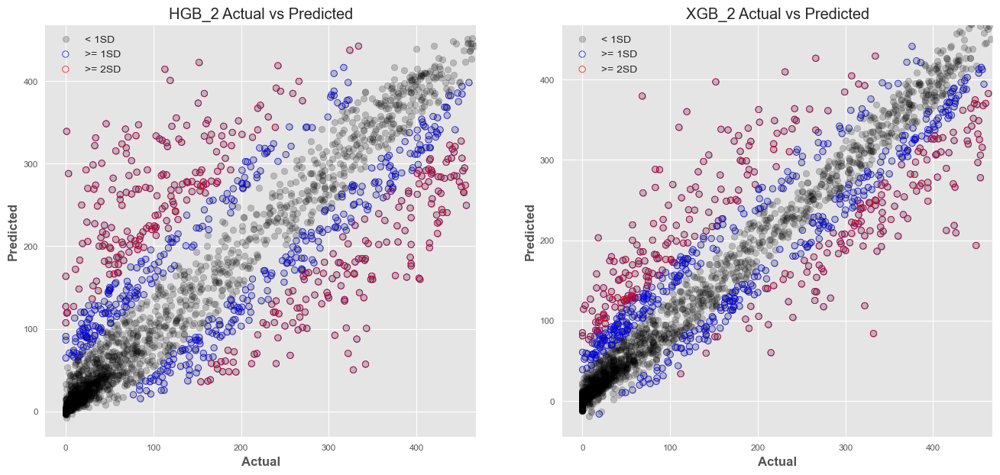

In [47]:
# With these in hand, let's look at where these errors lie in Actuals vs. Predictions
fig17, ax = plt.subplots(1, 2, figsize=(16, 7))
# Plot all points
ax[0].scatter(y_val2, hgb_preds2, color='black', alpha=0.2, label='< 1SD')
ax[1].scatter(y_val2, xgb_preds2, color='black', alpha=0.2, label='< 1SD')
# Highlight >1SD points
ax[0].scatter(df_val2_hgb_sd1['y_val'], df_val2_hgb_sd1['hgb2_preds'], color='b', facecolor='none', label='>= 1SD')
ax[1].scatter(df_val2_xgb_sd1['y_val'], df_val2_xgb_sd1['xgb2_preds'], color='b', facecolor='none', label='>= 1SD')
# Highlight >2SD points
ax[0].scatter(df_val2_hgb_sd2['y_val'], df_val2_hgb_sd2['hgb2_preds'], color='r', facecolor='none', label='>= 2SD')
ax[1].scatter(df_val2_xgb_sd2['y_val'], df_val2_xgb_sd2['xgb2_preds'], color='r', facecolor='none', label='>= 2SD')

ax[0].set_xlim(right=468)
ax[0].set_ylim(top=468)
ax[1].set_xlim(right=468)
ax[1].set_ylim(top=468)

ax[0].set_xlabel('Actual')
ax[1].set_xlabel('Actual')
ax[0].set_ylabel('Predicted')
ax[1].set_ylabel('Predicted')
ax[0].set_title("HGB_2 Actual vs Predicted")
ax[1].set_title("XGB_2 Actual vs Predicted")

ax[0].legend()
ax[1].legend()

There's not much to be said about our 1SD-level errors here; they are broadly in keeping with Linearity.

As for 2SD errors, we'll take a look at our other features in this range for both models.

In [48]:
print(f'df_val2_hgb_ds2 Rows: {len(df_val2_hgb_sd2)}, Columns: {len(df_val2_hgb_sd2.columns)}')
df_val2_hgb_sd2.columns

df_val2_hgb_ds2 Rows: 347, Columns: 40


Index(['ID', 'start', 'kw', 'capacity_clipped', 'S_d', 'airmass', 'altitude',
       'azimuth', 'irradiation', 'fold_cos', 'panel_cos', 'sunrise', 'sunset',
       'rad_lw_mean', 'precip_total_mean', 'cloud_total_mean',
       'temp_total_mean', 'cloud_high_mean', 'rad_global_mean',
       'cloud_low_mean', 'radNetS_lw_mean', 'cloud_mid_mean',
       'radNetS_sw_mean', 'dayofweek', 'dayofyear', 'month', 'hour_frac',
       'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'dayofwk_sin',
       'dayofwk_cos', 'dayofyr_sin', 'dayofyr_cos', 'y_val', 'hgb2_preds',
       'xgb2_preds', 'hgb_diff', 'xgb_diff'],
      dtype='object')

In [49]:
# It will be useful here to separate Under- and Over-predictions, so let's create a couple more dfs for convenience
df_val2_hgb_sd2over = df_val2[df_val2.hgb_diff <= -(hgb2_stddev * 2)]
df_val2_hgb_sd2under = df_val2[df_val2.hgb_diff >= (hgb2_stddev * 2)]

df_val2_xgb_sd2over = df_val2[df_val2.xgb_diff <= -(xgb2_stddev * 2)]
df_val2_xgb_sd2under = df_val2[df_val2.xgb_diff >= (xgb2_stddev * 2)]

In [50]:
# Make sure to drop any identifier- or result-related columns
result_cols = ['ID', 'start', 'capacity_clipped', 'sunrise', 'sunset', 'dayofyear', 'hgb2_preds', 'xgb2_preds', 'hgb_diff', 'xgb_diff']

C:\Users\gabor\AppData\Local\Temp\ipykernel_381808\2719304225.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_val2_hgb_sd2over.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)


Text(0.5, 0.92, 'HGB2 High-Error Over-predictions Features')

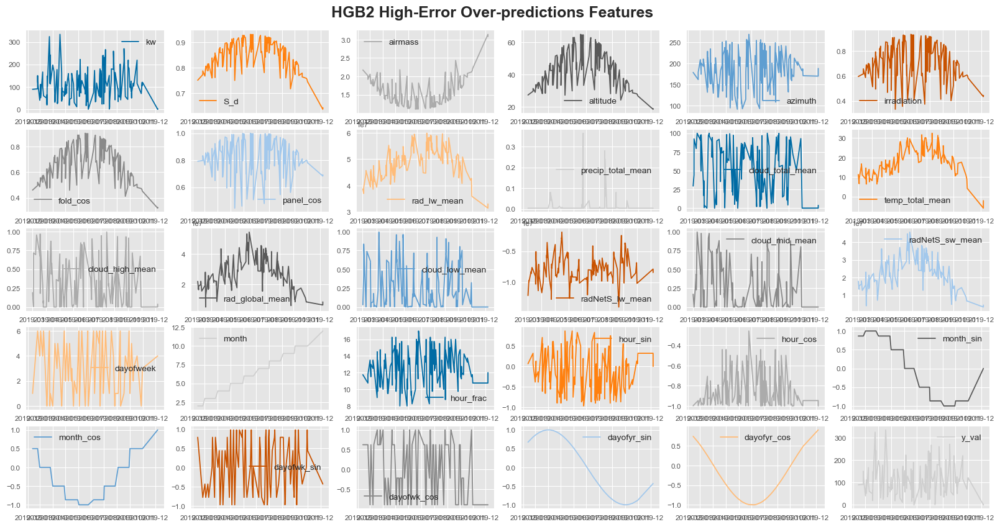

In [51]:
fig18, ax = plt.subplots(figsize=(20, 10))
df_val2_hgb_sd2over.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)
fig18.suptitle('HGB2 High-Error Over-predictions Features', y=0.92, fontsize=18, fontweight='bold')

C:\Users\gabor\AppData\Local\Temp\ipykernel_381808\896899782.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_val2_hgb_sd2under.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)


Text(0.5, 0.92, 'HGB2 High-Error Under-predictions Features')

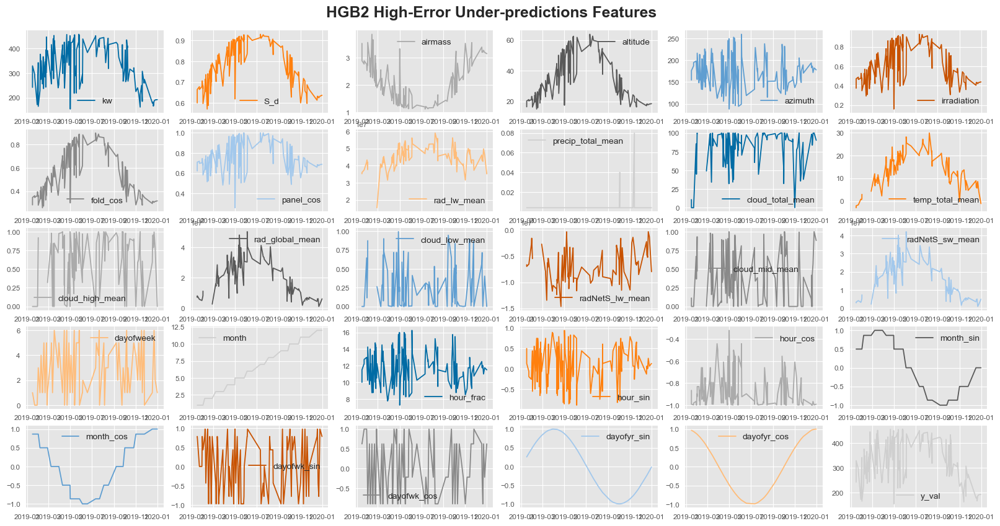

In [52]:
fig19, ax = plt.subplots(figsize=(20, 10))
df_val2_hgb_sd2under.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)
fig19.suptitle('HGB2 High-Error Under-predictions Features', y=0.92, fontsize=18, fontweight='bold')

C:\Users\gabor\AppData\Local\Temp\ipykernel_381808\4285591582.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_val2_xgb_sd2over.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)


Text(0.5, 0.92, 'XGB2 High-Error Over-predictions Features')

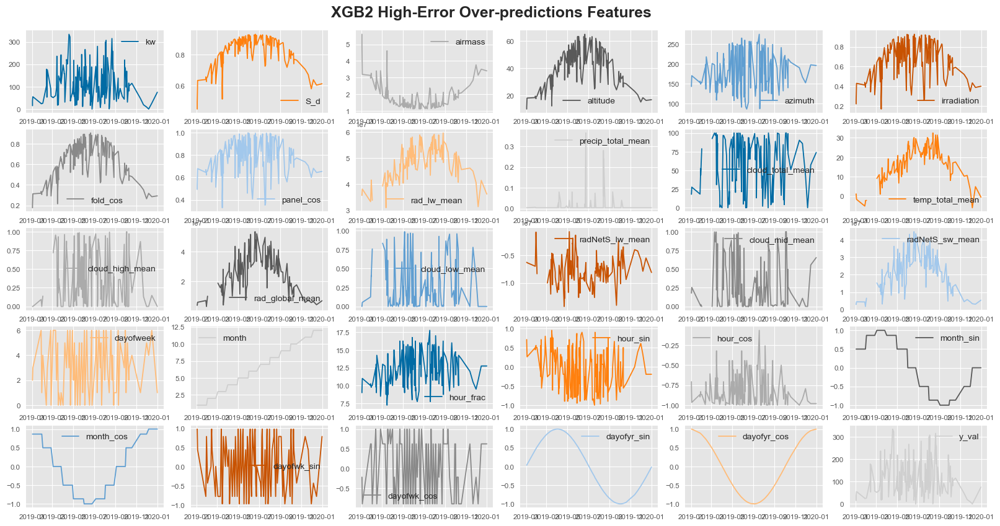

In [53]:
fig20, ax = plt.subplots(figsize=(20, 10))
df_val2_xgb_sd2over.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)
fig20.suptitle('XGB2 High-Error Over-predictions Features', y=0.92, fontsize=18, fontweight='bold')

C:\Users\gabor\AppData\Local\Temp\ipykernel_381808\1140581473.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_val2_xgb_sd2under.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)


Text(0.5, 0.92, 'XGB2 High-Error Under-predictions Features')

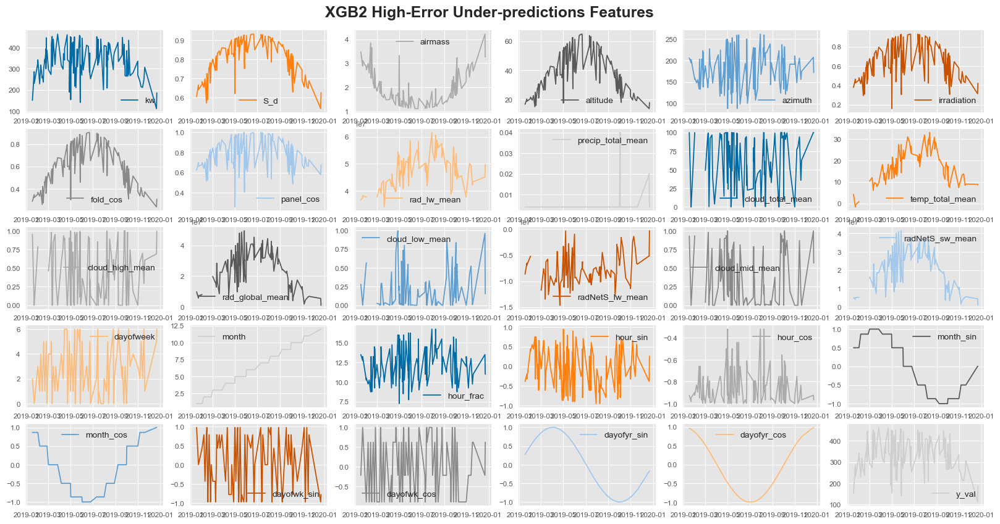

In [54]:
fig21, ax = plt.subplots(figsize=(20, 10))
df_val2_xgb_sd2under.drop(columns=result_cols).plot(subplots=True, layout=(5,6), ax=ax)
fig21.suptitle('XGB2 High-Error Under-predictions Features', y=0.92, fontsize=18, fontweight='bold')

Once again, a LOT to unpack here with broad overviews.

In short, there are only a couple things that are reasonably differentiable between these two types of data (High-error Over- and Under-predictions).
* In both models, 'radNetS_sw_mean' appears to trend slightly **lower** when we Over-predict and slightly **higher** when we Under-predict.
* Similarly, in both models, 'temp_total_mean' appears to trend slightly **higher** when we Over-predict and slightly **lower** when we Under-predict.

Let's observe the behavior of 'temp_total_mean' as compared to 'irradiation', which 'radNetS_sw_mean' is a constituent of.

### Over-predictions

In [55]:
df_val2_hgb_sd2over[['temp_total_mean', 'irradiation']].describe().T

,count,mean,std,min,25%,50%,75%,max
temp_total_mean,179.0,18.14779,7.238830,-5.912283,12.753422,18.189837,23.604871,32.465111
irradiation,183.0,0.71925,0.143261,0.333495,0.629500,0.737636,0.836428,0.931834


In [56]:
df_val2_xgb_sd2over[['temp_total_mean', 'irradiation']].describe().T

,count,mean,std,min,25%,50%,75%,max
temp_total_mean,159.0,17.137488,8.414779,-5.912283,12.228138,18.410919,23.059110,32.465111
irradiation,166.0,0.667154,0.184115,0.168243,0.539823,0.690076,0.823473,0.927682


Text(0.5, 0.92, 'HGB2, XGB2 High-Error Over-prediction Temp, Irradiation')

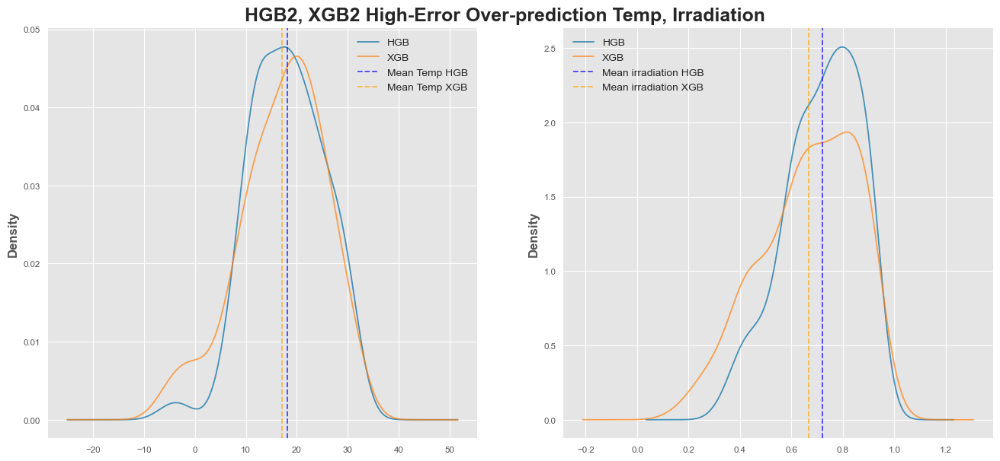

In [57]:
fig22, ax = plt.subplots(1, 2, figsize=(16, 7))
# 'temp_total_mean' KDE for >=SD2 over-prediction
df_val2_hgb_sd2over.temp_total_mean.plot.kde(label='HGB', alpha=0.7, ax=ax[0])
df_val2_xgb_sd2over.temp_total_mean.plot.kde(label='XGB', alpha=0.7, ax=ax[0])
ax[0].axvline(df_val2_hgb_sd2over.temp_total_mean.mean(),color='b', linestyle='--', alpha=0.7, label='Mean Temp HGB')
ax[0].axvline(df_val2_xgb_sd2over.temp_total_mean.mean(),color='orange', linestyle='--', alpha=0.7, label='Mean Temp XGB')
# 'radNetS_sw_mean' KDE for >=SD2 over-prediction
df_val2_hgb_sd2over.irradiation.plot.kde(label='HGB', alpha=0.7, ax=ax[1])
df_val2_xgb_sd2over.irradiation.plot.kde(label='XGB', alpha=0.7, ax=ax[1])
ax[1].axvline(df_val2_hgb_sd2over.irradiation.mean(),color='b', linestyle='--', alpha=0.7, label='Mean irradiation HGB')
ax[1].axvline(df_val2_xgb_sd2over.irradiation.mean(),color='orange', linestyle='--', alpha=0.7, label='Mean irradiation XGB')

ax[0].legend()
ax[1].legend()
fig22.suptitle('HGB2, XGB2 High-Error Over-prediction Temp, Irradiation', y=0.92, fontsize=18, fontweight='bold')

### Under-predictions

In [58]:
df_val2_hgb_sd2under[['temp_total_mean', 'irradiation']].describe().T

,count,mean,std,min,25%,50%,75%,max
temp_total_mean,132.0,13.443052,7.337771,-2.884806,8.443540,13.424436,19.415542,29.793882
irradiation,164.0,0.614263,0.182535,0.160219,0.467514,0.578282,0.776052,0.928631


In [59]:
df_val2_xgb_sd2under[['temp_total_mean', 'irradiation']].describe().T

,count,mean,std,min,25%,50%,75%,max
temp_total_mean,124.0,17.401830,7.664678,-1.624679,11.417431,17.325866,22.174383,32.972771
irradiation,140.0,0.656411,0.183142,0.160219,0.506300,0.676339,0.824151,0.928631


Text(0.5, 0.92, 'HGB2, XGB2 High-Error Under-prediction Temp, Irradiation')

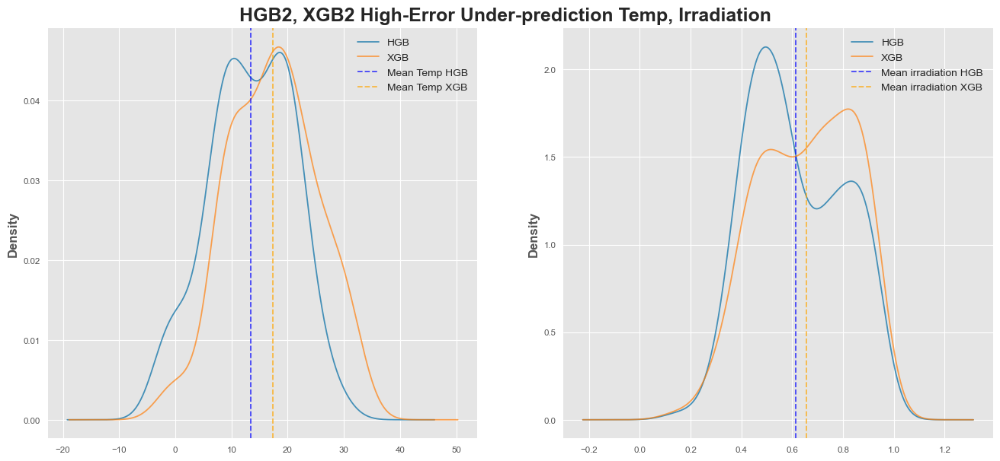

In [60]:
fig23, ax = plt.subplots(1, 2, figsize=(16, 7))
# 'temp_total_mean' KDE for >=SD2 under-prediction
df_val2_hgb_sd2under.temp_total_mean.plot.kde(label='HGB', alpha=0.7, ax=ax[0])
df_val2_xgb_sd2under.temp_total_mean.plot.kde(label='XGB', alpha=0.7, ax=ax[0])
ax[0].axvline(df_val2_hgb_sd2under.temp_total_mean.mean(),color='b', linestyle='--', alpha=0.7, label='Mean Temp HGB')
ax[0].axvline(df_val2_xgb_sd2under.temp_total_mean.mean(),color='orange', linestyle='--', alpha=0.7, label='Mean Temp XGB')
# 'radNetS_sw_mean' KDE for >=SD2 under-prediction
df_val2_hgb_sd2under.irradiation.plot.kde(label='HGB', alpha=0.7, ax=ax[1])
df_val2_xgb_sd2under.irradiation.plot.kde(label='XGB', alpha=0.7, ax=ax[1])
ax[1].axvline(df_val2_hgb_sd2under.irradiation.mean(),color='b', linestyle='--', alpha=0.7, label='Mean irradiation HGB')
ax[1].axvline(df_val2_xgb_sd2under.irradiation.mean(),color='orange', linestyle='--', alpha=0.7, label='Mean irradiation XGB')

ax[0].legend()
ax[1].legend()
fig23.suptitle('HGB2, XGB2 High-Error Under-prediction Temp, Irradiation', y=0.92, fontsize=18, fontweight='bold')

Let's break down the above.

## Over-predictions
1) The distribution of 'temp_total_mean' for High-Error Over-predictions is centered on higher values that the whole of our data.
* All-data **(Mean, Median)** : (13.03, 12.95)
* High-Error Over-predictions :
    * HGB **(Mean, Median)** : (18.15, 18.19)
    * XGB **(Mean, Median)** : (17.14, 18.41)
2) The distribution of 'irradiation' for High-Error Over-predictions is centered on higher values that the whole of our data.
* All-data **(Mean, 75th Percentile)** : (0.2193, 0.4331)
* High-Error Over-predictions :
    * HGB **(Mean, 25th Percentile)** : (0.7193, 0.6295)
    * XGB **(Mean, 25th Percentile)** : (0.6672, 0.5398)

### We can describe this qualitatively as the model not being taught that High Temperature values would dampen 'kW' values even with High available radiation.

## Under-predictions
By the metrics we described for Over-predictions, we actually see broadly similar traits in our Under-predicted data. We would need to explore this in much further depth, as there hasn't been any standout variation in this kind of data that could explain this behavior.

Technically, the 'temp_total_mean' and 'irradiation' distributions are less "normal", tending to populate lower values than they do in Over-predictions. Still, they are populated by plenty of the "highest available" values for both these features.

This might throw a small wrench in our logic, but still means that including 'temp_total_mean' as a factor **should** at least help with Over-predictions.

## Results so far (2)

Considering how XGBoost has performed thus far, as well as its potential to capture the Temperature dynamic we highlighted above, we're likely to close out this problem with it as our leading model. In addition, HistGradientBoosting's supposed advantage in handling NaN values was not evident in our results, and we'll be leaving it behind for now.

We have a couple options now that we've reached these conclusions about our data and modeling.

1) Include 'temp_total_mean' as a feature in our modeling process. This could reduce Over-predictions in our data, but would also become something we need to populate when finalizing the Reconstruction of our entire Time Series.

2) Ignore additional features and push forward with XGBoost as our basis for modeling, employing GridSearch techniques to squeeze additional performance out of our model's current understanding of the problem.

3) Combine both options for a possible "best" modeling option, with the same restrictions as (1).

We'll attempt both approaches to compare results.

### ------------------------------------------------------------------------------------------------------
# Modeling : Final Pass
### ------------------------------------------------------------------------------------------------------

### Approach (1)

In [61]:
# We should be able to re-use our most recent Train-Test Split, but we'll need to include 'temp_total_mean' in our features
features_temp = features_2 + ['temp_total_mean']

In [62]:
xgb_reg3 = XGBRegressor(random_state=432,
                       n_estimators= 10000, 
                       learning_rate= 0.01,
                       max_depth=5, 
                       early_stopping_rounds= 100,
                       eval_metric= ['mae']
                       )

# Fit
xgb_reg3.fit(X=X_train2[features_temp],
            y=y_train2, 
            eval_set = [(X_train2[features_temp], y_train2), (X_val2[features_temp], y_val2)], 
            verbose= 250
            )

# XGB's integrated validation here

[0]	validation_0-mae:96.91885	validation_1-mae:96.84863
[250]	validation_0-mae:28.99512	validation_1-mae:29.89456
[500]	validation_0-mae:22.62152	validation_1-mae:23.95509
[750]	validation_0-mae:21.13203	validation_1-mae:22.73117
[1000]	validation_0-mae:20.05202	validation_1-mae:21.92757
[1250]	validation_0-mae:19.06670	validation_1-mae:21.20213
[1500]	validation_0-mae:18.27534	validation_1-mae:20.69583
[1750]	validation_0-mae:17.50245	validation_1-mae:20.17681
[2000]	validation_0-mae:16.89363	validation_1-mae:19.78281
[2250]	validation_0-mae:16.40211	validation_1-mae:19.53369
[2500]	validation_0-mae:15.85473	validation_1-mae:19.26428
[2750]	validation_0-mae:15.32570	validation_1-mae:18.98768
[3000]	validation_0-mae:14.85551	validation_1-mae:18.77972
[3250]	validation_0-mae:14.44718	validation_1-mae:18.57510
[3500]	validation_0-mae:14.00640	validation_1-mae:18.35493
[3750]	validation_0-mae:13.60896	validation_1-mae:18.16765
[4000]	validation_0-mae:13.24574	validation_1-mae:17.99439
[42

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=['mae'], feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None, random_state=432, ...)

In [63]:
# Create Prediction series
xgb_preds3 = xgb_reg3.predict(X_val2[features_temp])

In [64]:
# Add new Predictions alongside ORIGINAL Standard Deviation source in 'df_val2'
df_val2['xgb3_preds'] = xgb_preds3
df_val2['xgb3_diff'] = y_val2 - xgb_preds3

df_val3_xgb_sd1 = df_val2[df_val2.xgb3_diff.abs() >= (xgb2_stddev)]     # MUST USE ORIGINAL STDDEV TO FILTER TO COMPARE CHANGES
df_val3_xgb_sd2 = df_val2[df_val2.xgb3_diff.abs() >= (xgb2_stddev * 2)]

Count XGB_2 Error >= 1SD : 752
Count XGB_3 Error >= 1SD : 727
Count XGB_2 Error >= 2SD : 306
Count XGB_3 Error >= 2SD : 292


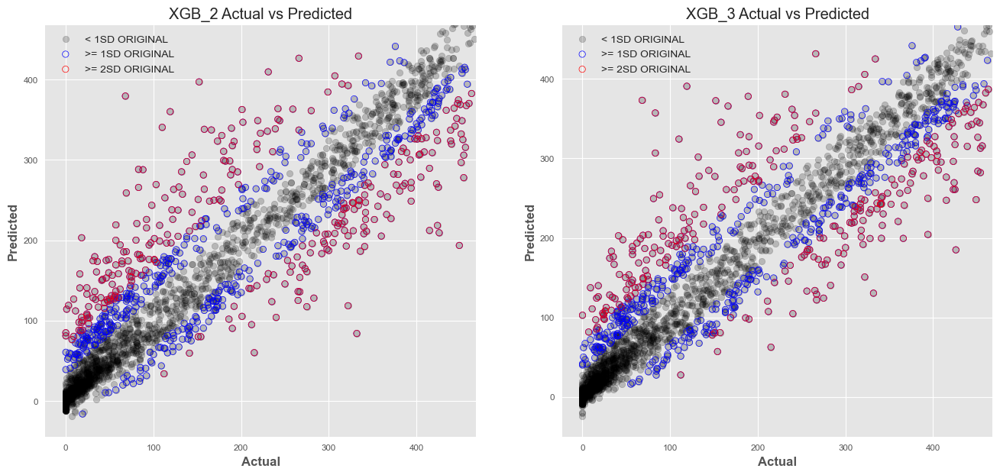

In [65]:
# Visualizing the behavior of both our models
fig24, ax = plt.subplots(1, 2, figsize=(16, 7))
# Plot all points
ax[0].scatter(y_val2, xgb_preds2, color='black', alpha=0.2, label='< 1SD ORIGINAL')
ax[0].scatter(df_val2_xgb_sd1['y_val'], df_val2_xgb_sd1['xgb2_preds'], color='b', facecolor='none', label='>= 1SD ORIGINAL')
ax[0].scatter(df_val2_xgb_sd2['y_val'], df_val2_xgb_sd2['xgb2_preds'], color='r', facecolor='none', label='>= 2SD ORIGINAL')

ax[1].scatter(y_val2, xgb_preds3, color='black', alpha=0.2, label='< 1SD ORIGINAL')
ax[1].scatter(df_val3_xgb_sd1['y_val'], df_val3_xgb_sd1['xgb3_preds'], color='b', facecolor='none', label='>= 1SD ORIGINAL')
ax[1].scatter(df_val3_xgb_sd2['y_val'], df_val3_xgb_sd2['xgb3_preds'], color='r', facecolor='none', label='>= 2SD ORIGINAL')

ax[0].set_xlim(right=468)
ax[0].set_ylim(top=468)
ax[1].set_xlim(right=468)
ax[1].set_ylim(top=468)

ax[0].set_xlabel('Actual')
ax[1].set_xlabel('Actual')
ax[0].set_ylabel('Predicted')
ax[1].set_ylabel('Predicted')
ax[0].set_title("XGB_2 Actual vs Predicted")
ax[1].set_title("XGB_3 Actual vs Predicted")

ax[0].legend()
ax[1].legend()

####
print(f'Count XGB_2 Error >= 1SD : {len(df_val2_xgb_sd1)}')
print(f'Count XGB_3 Error >= 1SD : {len(df_val3_xgb_sd1)}')
print(f'Count XGB_2 Error >= 2SD : {len(df_val2_xgb_sd2)}')
print(f'Count XGB_3 Error >= 2SD : {len(df_val3_xgb_sd2)}')

Visually AND numerically, there was not a huge gain from including 'temp_total_mean' as a feature in our modeling. In particular, over-predictions  appear mostly as frequent as prior, while under-predictions may have become more pronounced.

MAE dropped from 16.90280 to 16.16642, a reduction of ~4.36% and not a large absolute value.
This is also reflected in the number of >=1SD and >=2SD error predictions reduced.

This doesn't appear particularly promising, so let's attempt a GridSearch approach on our old Feature set.

### Approach (2)

In [256]:
# Instantiate and fit our GridSearchCV using XGBRegressor() and X_train2[features_2], y_train2
xgb_reg_cv = XGBRegressor()

# Param_grid was iterated through multiple times to ensure we avoided "guardrail" issues
### Full span of param_grid tests here
# param_grid={
#     "n_estimators": [2000, 3000, 5000, 7500, 10000, 15000, 20000],
#     "learning_rate": [0.05, 0.10, 0.15, 0.20, 0.25],
#     "max_depth": [ 3, 5, 7, 10],
#     "grow_policy": ['depthwise', 'lossguide'],
#     "early_stopping_rounds": [100],
#     "eval_metric": ['mae']
#     }

xgb_gcv = GridSearchCV(estimator=xgb_reg_cv,
                       param_grid={"n_estimators": [7500, 10000, 15000],
                                   "learning_rate": [0.01, 0.05, 0.10, 0.15],
                                   "max_depth": [7],
                                   "grow_policy": ['depthwise'],
                                   "early_stopping_rounds": [100],
                                   "eval_metric": ['mae']
                                   },
                       cv=3,
                       scoring='neg_mean_absolute_error',
                       verbose=500,
                       n_jobs=-1
)

grid_result = xgb_gcv.fit(X_train2[features_2],
                          y_train2,
                          eval_set=[(X_train2[features_2], y_train2), (X_val2[features_2], y_val2)],
                          verbose=250
                          )
print(grid_result.best_params_)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
[0]	validation_0-mae:93.50659	validation_1-mae:93.50794
[250]	validation_0-mae:12.64500	validation_1-mae:17.55778
[500]	validation_0-mae:8.96928	validation_1-mae:16.23253
[750]	validation_0-mae:6.73998	validation_1-mae:15.57048
[1000]	validation_0-mae:5.31497	validation_1-mae:15.15527
[1250]	validation_0-mae:4.33095	validation_1-mae:14.93430
[1500]	validation_0-mae:3.54228	validation_1-mae:14.80352
[1750]	validation_0-mae:2.92036	validation_1-mae:14.72210
[2000]	validation_0-mae:2.48596	validation_1-mae:14.67024
[2250]	validation_0-mae:2.12526	validation_1-mae:14.62084
[2500]	validation_0-mae:1.79835	validation_1-mae:14.56887
[2750]	validation_0-mae:1.56333	validation_1-mae:14.52984
[3000]	validation_0-mae:1.36108	validation_1-mae:14.48843
[3250]	validation_0-mae:1.18150	validation_1-mae:14.47022
[3500]	validation_0-mae:1.03611	validation_1-mae:14.45489
[3750]	validation_0-mae:0.91206	validation_1-mae:14.43705
[4000]	validati

In [263]:
grid_result.best_estimator_

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric='mae', feature_types=None,
             gamma=None, grow_policy='depthwise', importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=15000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [66]:
xgb_reg4 = XGBRegressor(random_state=432,
                        n_estimators= 15000, 
                        learning_rate= 0.05,
                        max_depth=7, 
                        early_stopping_rounds= 150,
                        grow_policy='depthwise',
                        eval_metric= ['mae']
                        )

xgb_reg4.fit(X=X_train2[features_2],
                 y=y_train2, 
                 eval_set = [(X_train2[features_2], y_train2), (X_val2[features_2], y_val2)], 
                 verbose= 500
                 )

[0]	validation_0-mae:93.50659	validation_1-mae:93.50794
[500]	validation_0-mae:8.96928	validation_1-mae:16.23253
[1000]	validation_0-mae:5.31497	validation_1-mae:15.15527
[1500]	validation_0-mae:3.54228	validation_1-mae:14.80352
[2000]	validation_0-mae:2.48596	validation_1-mae:14.67024
[2500]	validation_0-mae:1.79835	validation_1-mae:14.56887
[3000]	validation_0-mae:1.36108	validation_1-mae:14.48843
[3500]	validation_0-mae:1.03611	validation_1-mae:14.45489
[4000]	validation_0-mae:0.80754	validation_1-mae:14.42422
[4500]	validation_0-mae:0.63866	validation_1-mae:14.40088
[5000]	validation_0-mae:0.50225	validation_1-mae:14.38337
[5500]	validation_0-mae:0.40228	validation_1-mae:14.37098
[6000]	validation_0-mae:0.32686	validation_1-mae:14.36159
[6500]	validation_0-mae:0.26712	validation_1-mae:14.35064
[7000]	validation_0-mae:0.22013	validation_1-mae:14.34269
[7500]	validation_0-mae:0.17887	validation_1-mae:14.33563
[8000]	validation_0-mae:0.14889	validation_1-mae:14.33146
[8500]	validation

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=150,
             enable_categorical=False, eval_metric=['mae'], feature_types=None,
             gamma=None, grow_policy='depthwise', importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=15000, n_jobs=None,
             num_parallel_tree=None, random_state=432, ...)

In [67]:
xgb_preds4 = xgb_reg4.predict(X_val2[features_2])

Text(0.5, 1.0, 'XGB_4: Actual vs Predicted')

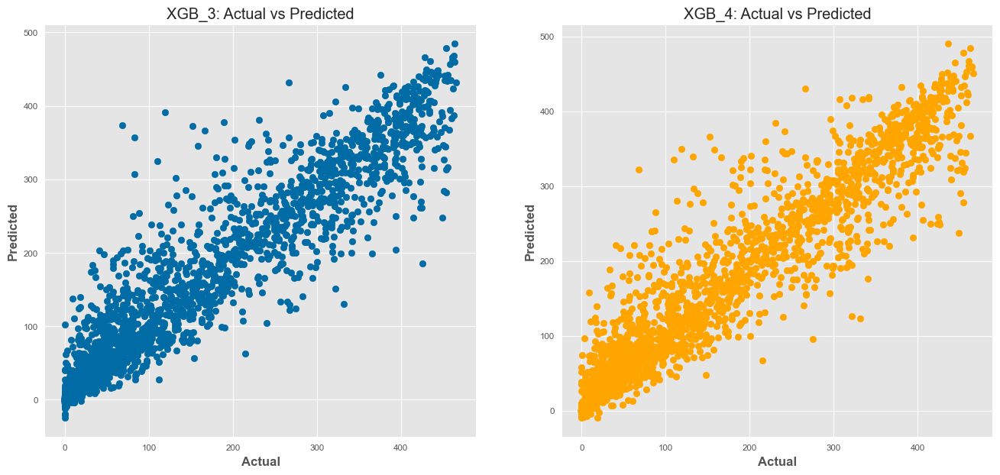

In [68]:
# Visualizing the behavior of both our models
fig25, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
ax1.scatter(y_val2, xgb_preds3)
ax2.scatter(y_val2, xgb_preds4, color='orange')
ax1.set_xlabel('Actual')
ax2.set_xlabel('Actual')
ax1.set_ylabel('Predicted')
ax2.set_ylabel('Predicted')
ax1.set_title("XGB_3: Actual vs Predicted")
ax2.set_title("XGB_4: Actual vs Predicted") 

### Approach (3)

In [69]:
xgb_reg_final = XGBRegressor(random_state=432,
                            n_estimators= 15000, 
                            learning_rate= 0.05,
                            max_depth=7, 
                            early_stopping_rounds= 150,
                            grow_policy='depthwise',
                            eval_metric= ['mae']
                            )

xgb_reg_final.fit(X=X_train2[features_temp],
                 y=y_train2, 
                 eval_set = [(X_train2[features_temp], y_train2), (X_val2[features_temp], y_val2)], 
                 verbose= 500
                 )

[0]	validation_0-mae:93.49078	validation_1-mae:93.49767
[500]	validation_0-mae:8.39272	validation_1-mae:15.54743
[1000]	validation_0-mae:4.97824	validation_1-mae:14.60342
[1500]	validation_0-mae:3.27262	validation_1-mae:14.27124
[2000]	validation_0-mae:2.22871	validation_1-mae:14.13601
[2500]	validation_0-mae:1.60667	validation_1-mae:14.04930
[3000]	validation_0-mae:1.19665	validation_1-mae:14.00530
[3500]	validation_0-mae:0.91948	validation_1-mae:13.97547
[4000]	validation_0-mae:0.71248	validation_1-mae:13.94892
[4500]	validation_0-mae:0.55257	validation_1-mae:13.92892
[5000]	validation_0-mae:0.43389	validation_1-mae:13.90446
[5500]	validation_0-mae:0.34358	validation_1-mae:13.89026
[6000]	validation_0-mae:0.27140	validation_1-mae:13.87672
[6500]	validation_0-mae:0.22075	validation_1-mae:13.86636
[7000]	validation_0-mae:0.17745	validation_1-mae:13.85705
[7500]	validation_0-mae:0.14503	validation_1-mae:13.85181
[8000]	validation_0-mae:0.11943	validation_1-mae:13.84596
[8500]	validation

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=150,
             enable_categorical=False, eval_metric=['mae'], feature_types=None,
             gamma=None, grow_policy='depthwise', importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=15000, n_jobs=None,
             num_parallel_tree=None, random_state=432, ...)

In [70]:
xgb_preds_final = xgb_reg_final.predict(X_val2[features_temp])

Text(0.5, 1.0, 'XGB_Final: Actual vs Predicted')

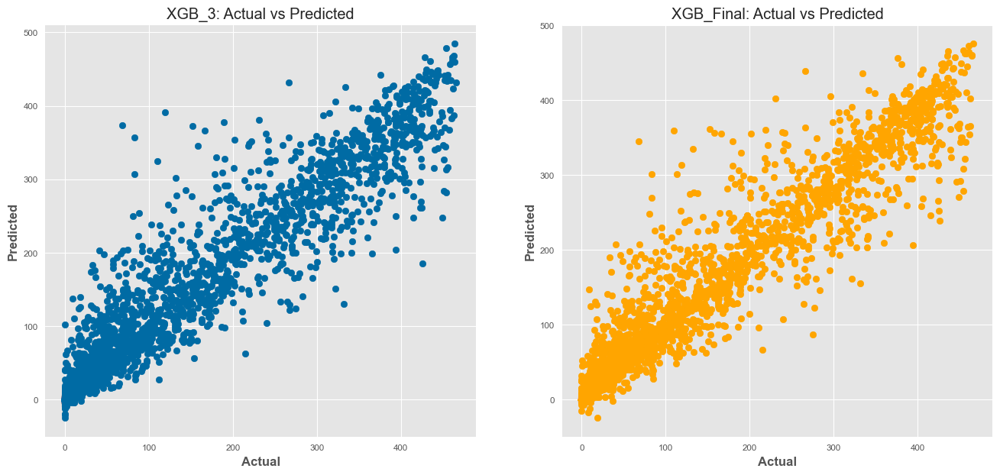

In [71]:
# Visualizing the behavior of both our models
fig26, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
ax1.scatter(y_val2, xgb_preds3)
ax2.scatter(y_val2, xgb_preds_final, color='orange')
ax1.set_xlabel('Actual')
ax2.set_xlabel('Actual')
ax1.set_ylabel('Predicted')
ax2.set_ylabel('Predicted')
ax1.set_title("XGB_3: Actual vs Predicted")
ax2.set_title("XGB_Final: Actual vs Predicted")

### Modeling conclusions:

It's safe to say that the inclusion of both our Temperature data and a GridSearchCV approach to model tuning results in our best error metrics, at MAE of 13.82698. However, a GridSearchCV-only approach was not far behind with MAE of 14.30757. This is only a 3% reduction in error found from including additional "atmospheric" data.

At this point, we conclude that there are two options for model application, especially as far as our Reconstruction goes:
1) Include Temperature as a Feature and introduce more NaN-propagation as we fill the gaps in our data, with the hope that our overall performance is improved. This could introduce issues with imputation/interpolation, where we are unlikely to be able to create or assume good values for temperature easily for new inputs.
2) Ignore Temperature as a Feature, moving forward with the rest of the Features we lined up before it, and accept the "baseline" level of NaN data from 'cloud_total_mean' which we are equally unlikely to be able to create or assume good values for easily.

**In the future, we'll apply option (2) to Reconstruct the span of our data** 

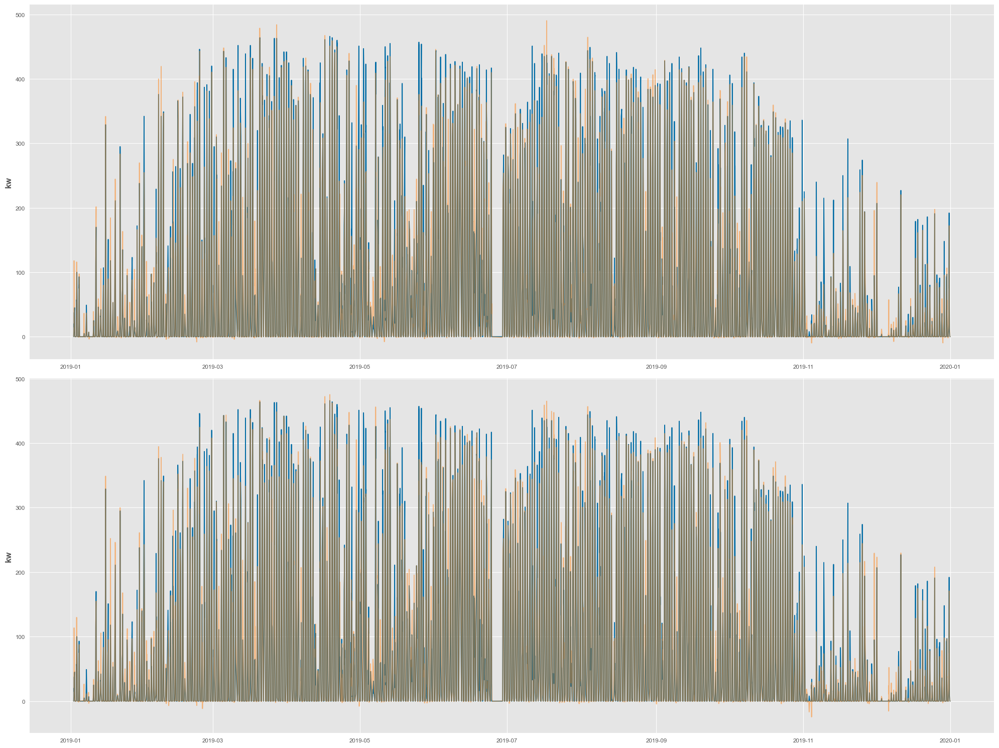

In [76]:
# Let's first look at how predictions from our latest model behave across the year of 'kW' values.
# To clarify, this is from 'xgb_reg4'

fig27, ax = plt.subplots(2, 1, figsize=(20, 15))
sns.lineplot(x=y_val2.index, y=y_val2, ax=ax[0])
sns.lineplot(x=y_val2.index, y=xgb_preds4, alpha=0.5, ax=ax[0])
sns.lineplot(x=y_val2.index, y=y_val2, ax=ax[1])
sns.lineplot(x=y_val2.index, y=xgb_preds_final, alpha=0.5, ax=ax[1])
plt.tight_layout()